# Projet Machine Learning : Notebook Python

L'objectif de ce notebook est d'étudier le jeu de données "Global Data on Sustainable Energy" (2000-2020) issu du site KAGGLE dans l'objectif de prédire la valeur du C02.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

Il est important de noter que dansla suite de notre étude le notebook Python comprendra toutes les analyses précises et le notebook R ne comportera que des commentaires succincts.

## Analyse exploratoire des données

Pour ce faire nous commençons par effectuer une analyse exploratoire des données afin de nous familiariser avec celles-ci et de les préparer aux phases de modélisation pour en tirer de nouvelles conclusions.

**1. Commencez par vérifier la nature des différentes variables et leur encodage. Convertissez la variable Year en une variable qualitative. N.B. Curieusement, la variable Density (P/Km2) n’est pas considérée comme une variable numérique. Convertissez-là en une variable numérique en prenant soin de ne pas transformer les nombres décimaux en NA.**

Nous commençons par importer le dataframe sur le notebook puis nous l'affichons afin d'avoir un aperçu des données : le nom des colonnes, la nature des variables et les 5 première lignes.

In [2]:
#Importation du dataframe 
df = pd.read_csv('global-data-on-sustainable-energy (1).csv')

#Aperçu des données des 5 premières lignes 
df.head()

,Entity,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable-electricity-generating-capacity-per-capita,Financial flows to developing countries (US $),Renewable energy share in the total final energy consumption (%),Electricity from fossil fuels (TWh),Electricity from nuclear (TWh),Electricity from renewables (TWh),...,Primary energy consumption per capita (kWh/person),Energy intensity level of primary energy (MJ/$2017 PPP GDP),Value_co2_emissions_kt_by_country,Renewables (% equivalent primary energy),gdp_growth,gdp_per_capita,Density(P/Km2),Land Area(Km2),Latitude,Longitude
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,...,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,...,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,...,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,33.93911,67.709953
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,...,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,33.93911,67.709953
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,...,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,33.93911,67.709953


Ensuite, nous modifions les variables 'Year' et 'Entity' pour quelles deviennent des variables qualitatives dans notre jeu de donneés. 
De plus, nous traitons la variable 'Density' pour avoir les bonnes valeurs.

In [3]:
#Discrétisation des variables 'Year' et 'Entity'
print("----Variable Year----")
df["Year"]=pd.Categorical(df["Year"],ordered=False)
print(df['Year'].describe(),'\n')

print("----Variable Entity----")
df["Entity"]=pd.Categorical(df["Entity"],ordered=False)
print(df['Entity'].describe(),'\n')

#Traitement de la variable 'Density'

print("----Variable Density(P/Km2)----")
df["Density(P/Km2)"] = df["Density(P/Km2)"].apply(lambda x : float(x.replace(',','')) if type(x)==str else x)
print(df['Density(P/Km2)'].describe())

----Variable Year----
count     3649
unique      21
top       2020
freq       175
Name: Year, dtype: int64 

----Variable Entity----
count            3649
unique            176
top       Afghanistan
freq               21
Name: Entity, dtype: object 

----Variable Density(P/Km2)----
count    3648.000000
mean      216.423520
std       677.799972
min         2.000000
25%        34.000000
50%        87.000000
75%       214.000000
max      8358.000000
Name: Density(P/Km2), dtype: float64


**2. Déterminez le taux de valeurs manquantes pour chaque variable.**

On affiche ici la proportion de valeurs manquantes pour chacune des variables numériquement et sur un bar plot pour avoir un rendu plus visuel.

Entity                                                              0.000000
Year                                                                0.000000
Access to electricity (% of population)                             0.002740
Access to clean fuels for cooking                                   0.046314
Renewable-electricity-generating-capacity-per-capita                0.255138
Financial flows to developing countries (US $)                      0.572486
Renewable energy share in the total final energy consumption (%)    0.053165
Electricity from fossil fuels (TWh)                                 0.005755
Electricity from nuclear (TWh)                                      0.034530
Electricity from renewables (TWh)                                   0.005755
Low-carbon electricity (% electricity)                              0.011510
Primary energy consumption per capita (kWh/person)                  0.000000
Energy intensity level of primary energy (MJ/$2017 PPP GDP)         0.056728

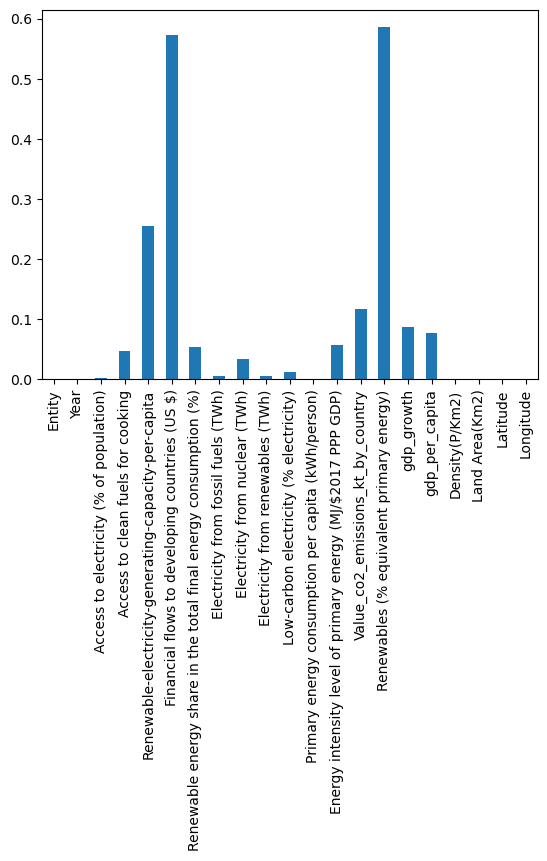

In [4]:
#Affichage de la proportion de valeurs manquantes pour chaque variable
print(df.isna().sum()/len(df),'\n')

nrows = len(df)
missing_rates = 1-df.count(axis=0)/nrows

#Affichage de cette proportion sur un barplot
plt.figure()
missing_rates.plot.bar()
plt.show()

On remarque alors que les trois variables *'Renewable-electricity-generating-capacity-per-capita','Financial flows to developing countries (US $)'* et *'Renewables (% equivalent primary energy)'* comportent une très grande quantité de valeurs manquantes, nous décidons donc de les supprimer de notre étude pour ne pas fosser le résultat de nos futures prédictions. 

In [5]:
#Suppression des variables contenant trop de valeurs manquantes 
df = df.drop(labels=["Renewable-electricity-generating-capacity-per-capita",
                     "Financial flows to developing countries (US $)",
                     "Renewables (% equivalent primary energy)"],
             axis='columns')

#Affichage du nouveau dataframe sans les 3 variables précédentes
df.head()

,Entity,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable energy share in the total final energy consumption (%),Electricity from fossil fuels (TWh),Electricity from nuclear (TWh),Electricity from renewables (TWh),Low-carbon electricity (% electricity),Primary energy consumption per capita (kWh/person),Energy intensity level of primary energy (MJ/$2017 PPP GDP),Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density(P/Km2),Land Area(Km2),Latitude,Longitude
0,Afghanistan,2000,1.613591,6.2,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,60.0,652230.0,33.93911,67.709953
1,Afghanistan,2001,4.074574,7.2,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,60.0,652230.0,33.93911,67.709953
2,Afghanistan,2002,9.409158,8.2,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,179.426579,60.0,652230.0,33.93911,67.709953
3,Afghanistan,2003,14.738506,9.5,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,8.832278,190.683814,60.0,652230.0,33.93911,67.709953
4,Afghanistan,2004,20.064968,10.9,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,1.414118,211.382074,60.0,652230.0,33.93911,67.709953


**3. Pour la suite de l’étude, vous allez créer un jeu de données comportant seulement les individus qui n’ont pas de valeur manquante. Il reste alors 2868 observations.**

Nous modifions une nouvelle fois notre dataframe en supprimant maintenant toutes les lignes qui comportent au moins une valeur manquante.

In [6]:
#Suppression des lignes contenant des valeurs manquantes
df = df.dropna()
print("Le jeu de données contient désormais",len(df),"lignes, après avoir supprimé les lignes comportant des valeurs manquantes.")

Le jeu de données contient désormais 2868 lignes, après avoir supprimé les lignes comportant des valeurs manquantes.


**4. Commencez l’exploration par une analyse descriptive unidimensionnelle des données. Des transformations des variables quantitatives vous semblent-t-elles pertinentes ?**

Après avoir bien formaté notre dataframe nous pouvons passer à l'analyse descriptive de nos données.
On commence par afficher les caractéristiques statistiques descriptives liées à nos données.

In [7]:
#Affichage des statistiques descriptives de nos données 
df.describe()

,Access to electricity (% of population),Access to clean fuels for cooking,Renewable energy share in the total final energy consumption (%),Electricity from fossil fuels (TWh),Electricity from nuclear (TWh),Electricity from renewables (TWh),Low-carbon electricity (% electricity),Primary energy consumption per capita (kWh/person),Energy intensity level of primary energy (MJ/$2017 PPP GDP),Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density(P/Km2),Land Area(Km2),Latitude,Longitude
count,2868.000000,2868.000000,2868.000000,2868.000000,2868.000000,2868.000000,2868.000000,2868.000000,2868.000000,2.868000e+03,2868.000000,2868.000000,2868.000000,2.868000e+03,2868.000000,2868.000000
mean,76.584630,62.170084,35.802071,76.693556,15.337019,26.603375,39.629403,26082.456843,5.418111,1.688182e+05,3.895326,12577.050921,219.553696,6.581668e+05,18.140402,12.970486
std,31.510371,39.238548,30.024000,374.419806,78.776075,107.640273,34.454884,37097.457254,3.577415,8.180202e+05,4.645613,18730.476190,736.086276,1.705048e+06,24.924975,65.478645
min,1.252269,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,105.110120,1.030000,3.000000e+01,-36.658153,111.927225,2.000000,2.100000e+01,-40.900557,-175.198242
25%,53.237811,22.075000,9.187500,0.290000,0.000000,0.090000,6.091074,2779.966525,3.280000,2.187500e+03,1.770575,1209.802655,31.000000,2.974300e+04,1.650801,-10.940835
50%,97.000000,81.550000,28.790000,2.995000,0.000000,1.680000,35.009718,11922.761000,4.400000,1.042500e+04,3.788166,4168.110171,83.000000,1.319570e+05,17.060816,18.643501
75%,100.000000,100.000000,60.667500,25.787500,0.000000,10.102500,66.879318,31838.556000,6.140000,5.814500e+04,5.957490,14828.344425,203.000000,4.881000e+05,39.399872,43.679291
max,100.000000,100.000000,96.040000,5098.220000,809.410000,2014.570000,100.000010,262585.700000,32.570000,1.070722e+07,63.379875,123514.196700,8358.000000,9.984670e+06,64.963051,178.065032


Avec le tableau ci-dessus, on se rend compte que beaucoup de variables prennent des grandes plages de valeurs. 

Par exemple, la variable *'Primary energy consumption per capita (kWh/person)'* prend des valeurs entre 105 et 262585, avec une moyenne de 26082. Cette grosse différence d'échelle au sein d'une même colonne nous met sur la piste d'une potentielle transformation logarithmique des données.

Ci-dessous, nous allons afficher les données ainsi que leurs transformations logarithmiques, afin de se rendre compte graphiquement pour quelles variables la transformation est pertinente.

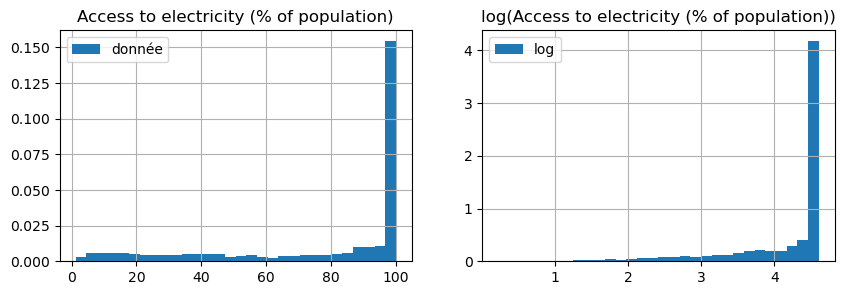

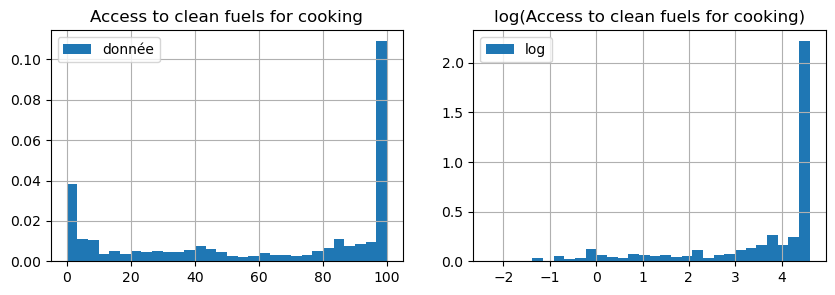

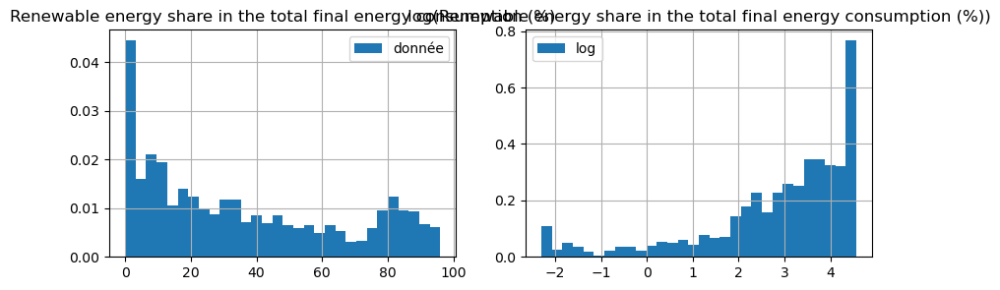

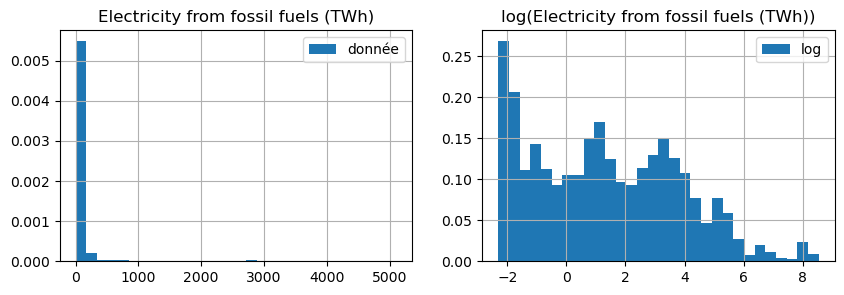

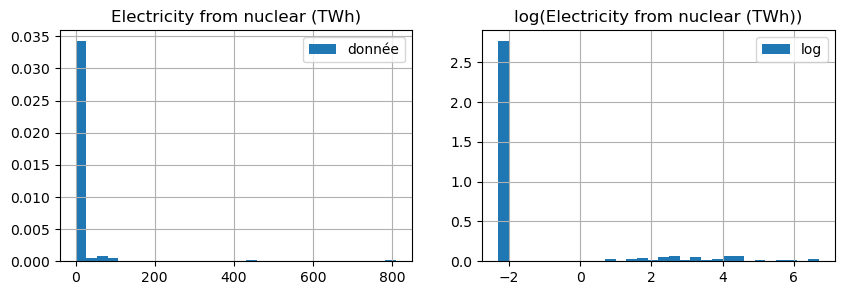

...

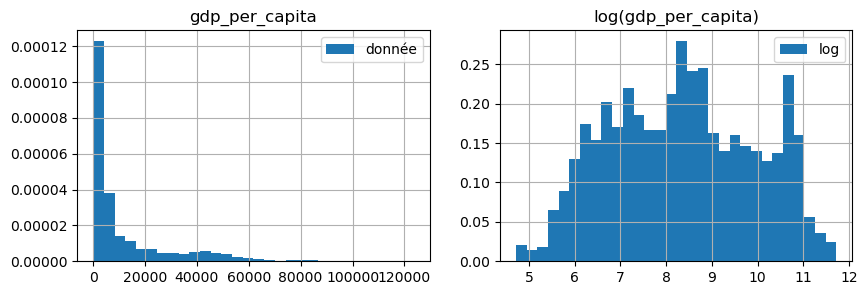

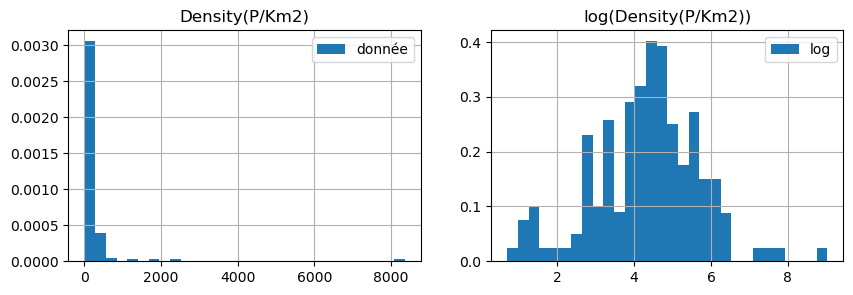

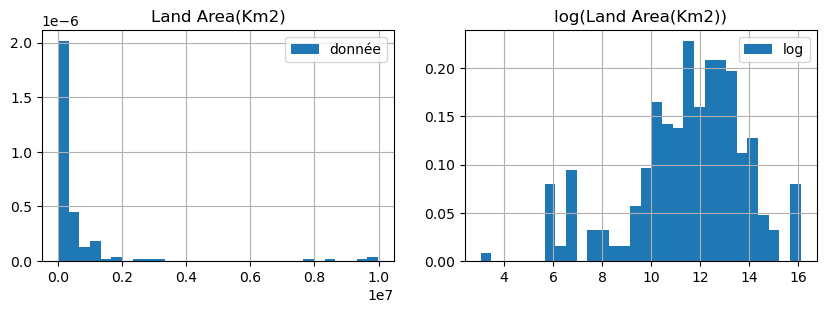

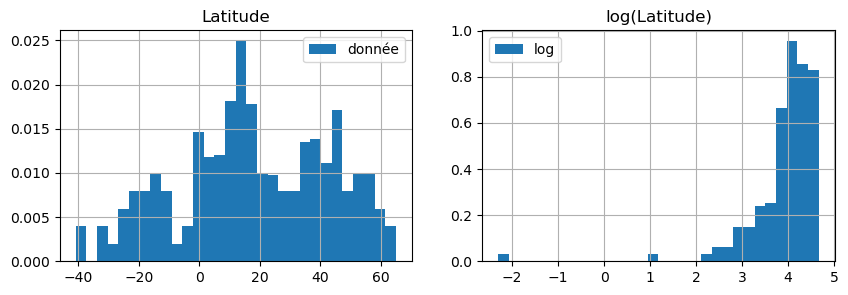

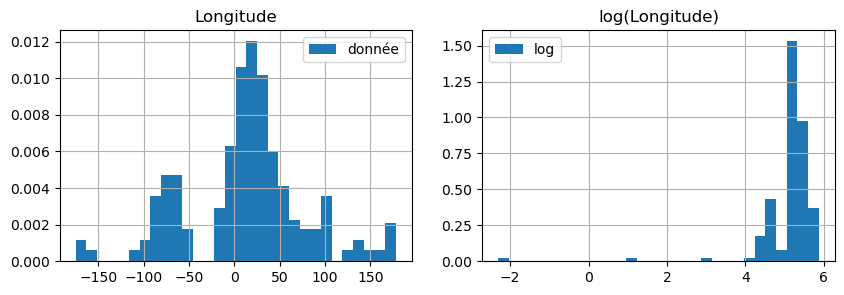

In [8]:
#Création d'un vecteur ne comportant que les variables quantitatives
interesting_columns = [col for col in df.columns if col not in ['Entity', 'Year']]

nbins = 30

#Création des barplots des variables quantitatives et de leur transformations logarithmiques
for column_to_test in interesting_columns :
    
    eps = (min(df[column_to_test]) <= 0) * (abs(min(df[column_to_test])) + 0.1)

    plt.figure(figsize=(10,3))
    
    plt.subplot(1,2,1)
    df[column_to_test].hist(density=True,label='donnée',bins=nbins)
    plt.title(column_to_test)
    plt.legend()
    
    plt.subplot(1,2,2)
    np.log(df[column_to_test] + eps).hist(density=True,label='log',bins=nbins)
    plt.title('log(' + column_to_test + ')')
    plt.legend()
    
    plt.show()

Ci-dessus, nous affichons les données du dataframe ainsi que leurs transformations logarithmiques (en ajoutant un offset pour les données prenant des valeurs négatives ou nulles). On considère que la transfomation améliore nos données si la répartition de nos données transformées ressemble plus à une gaussienne. Ainsi, on peut dire que la transformation logarithmique est pertinente pour 6 colonnes que sont : 

- 'Primary energy consumption per capita (kWh/person)'
- 'Energy intensity level of primary energy (MJ/$2017 PPP GDP)'
- 'Value_co2_emissions_kt_by_country'
- 'gdp_per_capita'
- 'Density(P/Km2)'
- 'Land Area(Km2)'. 

On décide de créer de nouvelles colonnes à notre dataframe pour sauvegarder nos transformations log. Par exemple pour la variable 'gdp_per_capita', nous avons la colonne d'origine et nous crééons 'log_gdp_per_capita' qui comporte le log de 'gdp_per_capita'.

In [9]:
#on sauvegarde les variables que l'on va transformer dans un vecteur
column_log = ['Primary energy consumption per capita (kWh/person)',
              'Energy intensity level of primary energy (MJ/$2017 PPP GDP)',
              'Value_co2_emissions_kt_by_country',
              'gdp_per_capita',
              'Density(P/Km2)',
              'Land Area(Km2)']

#on rajoute des colonnes avec les variables transformées en log
for column in column_log :
    df['log_'+column] = np.log(df[column])
    interesting_columns += ['log_' + column]

#Affichage du nouveau dataframe pour visualiser les nouvelles colonnes
df.head()

,Entity,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable energy share in the total final energy consumption (%),Electricity from fossil fuels (TWh),Electricity from nuclear (TWh),Electricity from renewables (TWh),Low-carbon electricity (% electricity),Primary energy consumption per capita (kWh/person),...,Density(P/Km2),Land Area(Km2),Latitude,Longitude,log_Primary energy consumption per capita (kWh/person),log_Energy intensity level of primary energy (MJ/$2017 PPP GDP),log_Value_co2_emissions_kt_by_country,log_gdp_per_capita,log_Density(P/Km2),log_Land Area(Km2)
3,Afghanistan,2003,14.738506,9.50,36.66,0.31,0.0,0.63,67.021280,229.96822,...,60.0,652230.0,33.93911,67.709953,5.437941,0.336472,7.106606,5.250617,4.094345,13.388153
4,Afghanistan,2004,20.064968,10.90,44.24,0.33,0.0,0.56,62.921350,204.23125,...,60.0,652230.0,33.93911,67.709953,5.319253,0.182322,6.937314,5.353667,4.094345,13.388153
5,Afghanistan,2005,25.390894,12.20,33.88,0.34,0.0,0.59,63.440857,252.06912,...,60.0,652230.0,33.93911,67.709953,5.529703,0.343590,7.346010,5.489067,4.094345,13.388153
6,Afghanistan,2006,30.718690,13.85,31.89,0.20,0.0,0.64,76.190475,304.42090,...,60.0,652230.0,33.93911,67.709953,5.718411,0.405465,7.473069,5.574940,4.094345,13.388153
7,Afghanistan,2007,36.051010,15.30,28.78,0.20,0.0,0.75,78.947370,354.27990,...,60.0,652230.0,33.93911,67.709953,5.870087,0.425268,7.478735,5.885251,4.094345,13.388153


**5. Visualisez la grande hétérogénéité des émissions de CO2 entre les pays. Quels sont les 5 pays les plus émetteurs de CO2 ?**

On s'intéresse désormais à la variable *'Value_co2_emissions_kt_by_country'*. 

On commence par trier les valeurs des émissions pour chaque pays et on affiche un barplot des 50 pays les plus émetteurs. Cela nous permet de nous rendre compte de la grande hétérogéneité des émissions entre les pays. En effet, on voit qu'il y a 5 pays qui comportent une valeur d'émissions supérieure à 1.5e7, puis les valeurs des autres pays sont beaucoup plus faibles. 

On renvoie ensuite les valeurs des émissions de C02 pour les différents pays puis on affiche le barplot avec les 5 pays les plus émetteurs. 

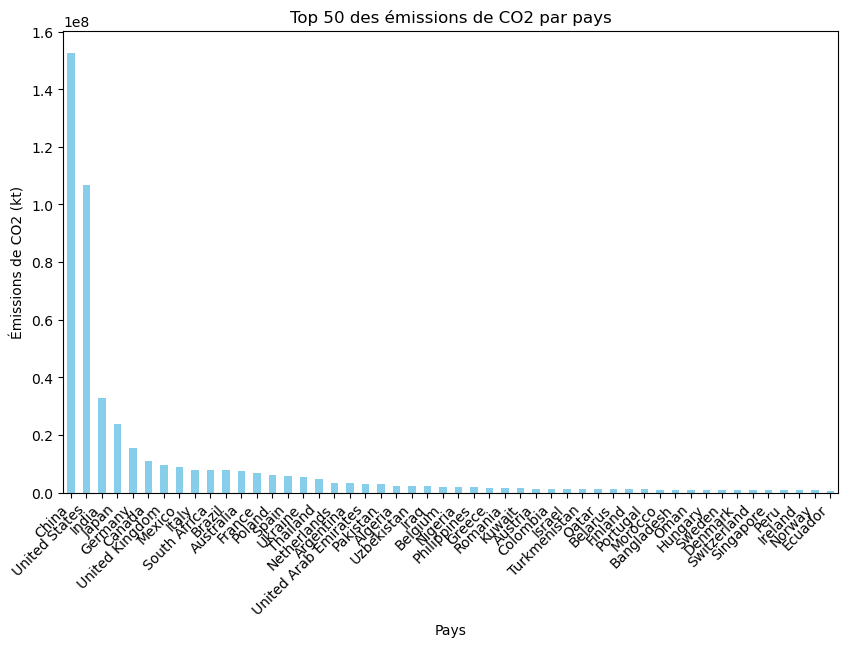

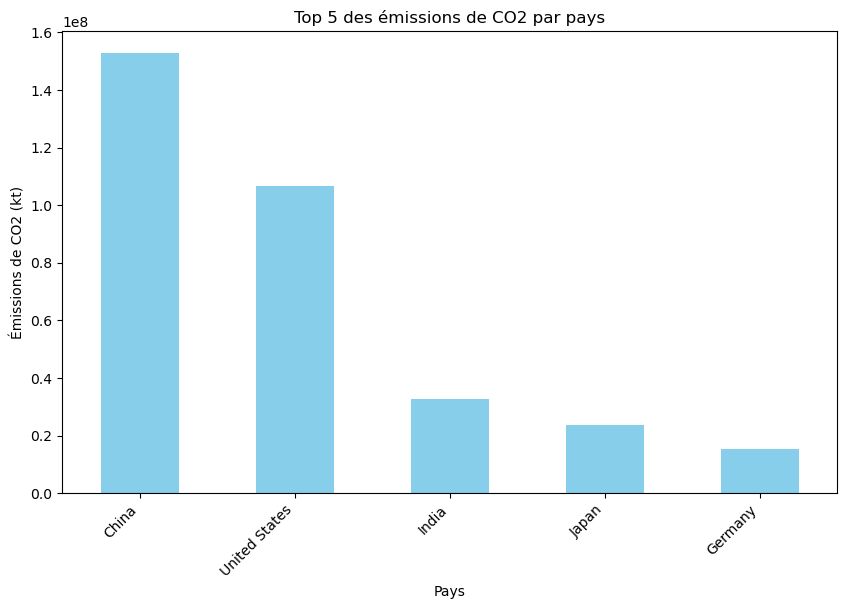

In [10]:
# Tri par ordre décroissant des valeurs des émissions par pays
emissions_par_pays = df.groupby('Entity')['Value_co2_emissions_kt_by_country'].sum().sort_values(ascending=False)

#Affichage en bar plot des 50 pays les plus émetteurs 
plt.figure(figsize=(10, 6))
emissions_par_pays.head(50).plot(kind='bar', color='skyblue')
plt.title('Top 50 des émissions de CO2 par pays')
plt.xlabel('Pays')
plt.ylabel('Émissions de CO2 (kt)')
plt.xticks(rotation=45, ha='right')
plt.show()

#Barplot des 5 pays les plus émetteurs
plt.figure(figsize=(10, 6))
emissions_par_pays.head(5).plot(kind='bar', color='skyblue')
plt.title('Top 5 des émissions de CO2 par pays')
plt.xlabel('Pays')
plt.ylabel('Émissions de CO2 (kt)')
plt.xticks(rotation=45, ha='right')
plt.show()



**6. Poursuivez avec une analyse descriptive multidimensionnelle. Utilisez des techniques de visualisation: par exemple les nuages de points (scatterplot), des graphes des correlations... Analysez les dépendances entre les variables quantitatives.**

Afin de poursuivre notre étude, on analyse le point de vue descriptif multidimensionnel, on commence par afficher la matrice de corrélation entre les différentes variables. 

Cet affichage nous permet de voir qu'il existe une corrélation très importante (proche de 1 : 0.99) entre la variable à prédire 'Value_co2_emissions_kt_by_country' et  'Electricity from fossil fuels (TWh)'. De plus, on peut aussi noter une corrélation conséquente entre ''Value_co2_emissions_kt_by_country' et 'Electricity from renewables (TWh)'. 

On peut aussi conclure des liens moins important entre 'log_Value_co2_emissions_kt_by_country' et 'Land Area(Km2)', 'Access to clean fuels for cooking', et 'log_Primary energy consumption per capita (kWh/person)'.

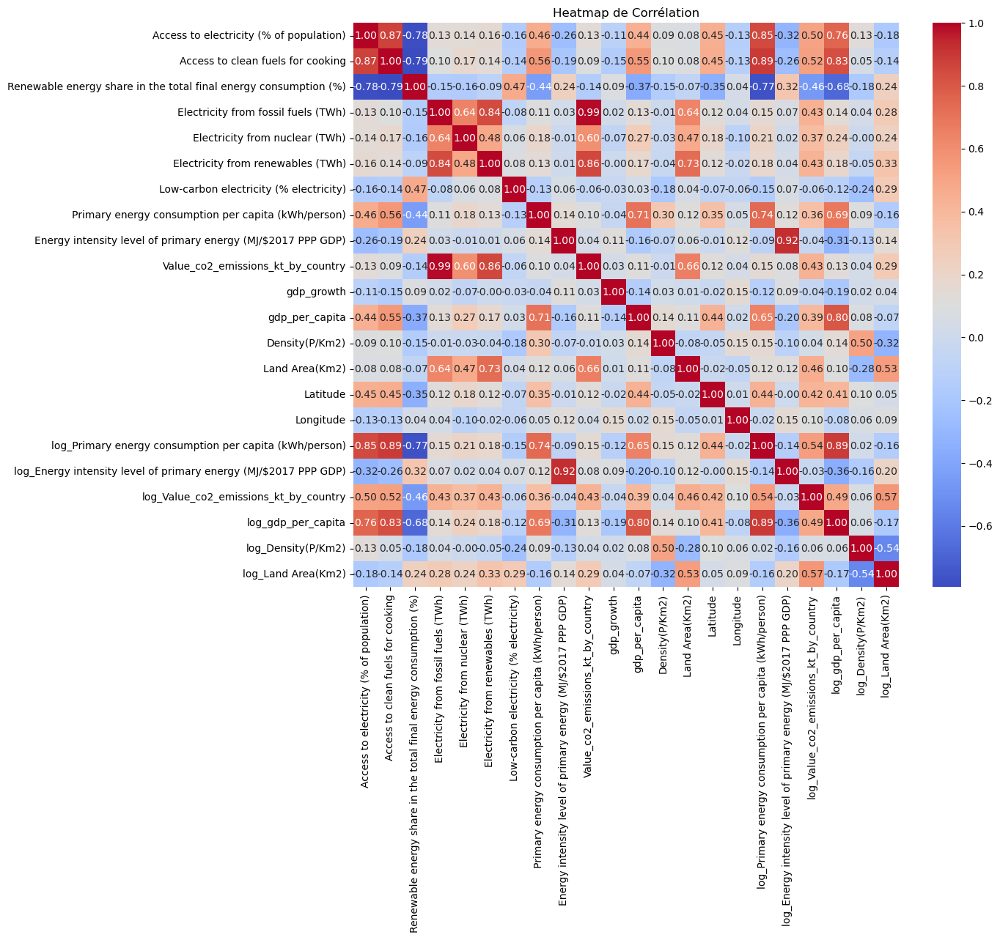

In [11]:
import seaborn as sns

#Affichage de la matrice de corrélation de notre dataset df
correlation_matrix = df.corr(numeric_only=True)

#Paramètre d'affichage
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap de Corrélation')
plt.show()

On affiche également le nuage point des différentes variables.Cependant, à cause du grand nombre de variables, une analyse précise ce graphique reste compliquée.


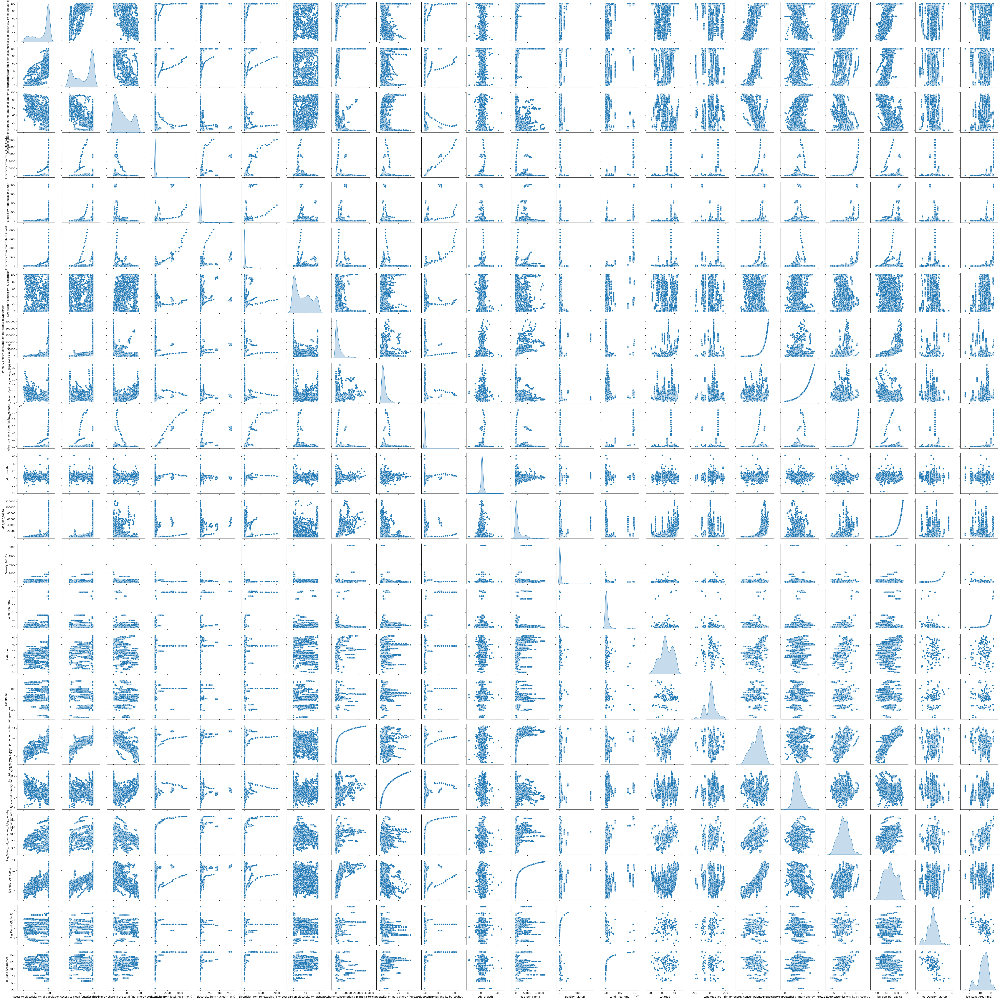

In [12]:
#Importation des library
from pandas.plotting import scatter_matrix
import seaborn as sns

# Nuage de points des variables quantitatives
sns.pairplot(df[interesting_columns],diag_kind='kde')

plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

**7. Réalisez une analyse en composantes principales des variables quantitatives et interprétez les résultats.**

Afin de simplifier la dimension de notre dataframe, on souhaite réaliser une Analyse en composantes principales (ACP). 

Pour cela, nous commençons par afficher les boxplots des variables quantitatives sur la même échelle, pour voir s'il est intéressant de standardiser nos données. En effet, si nos données ne sont pas exprimées dans la même échelle cela peut influencer l'importance qu'a une variable sur notre ACP. 

C'est le cas ici et les boxplots nous montrent bien cet écart d'échelle. Ainsi, on commence par standardiser nos données. 

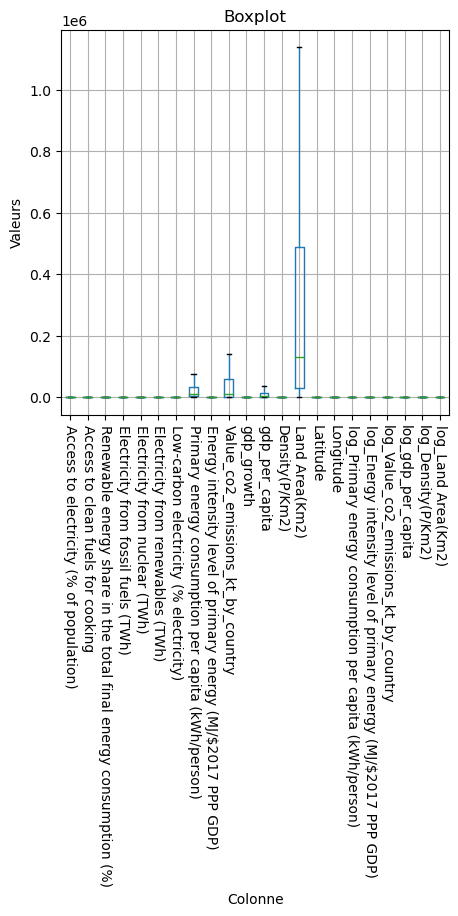

In [13]:
#Affichage en boxplot des variables qualitatives sur la meme échelle
plt.figure(figsize=(5,5))
df.boxplot(interesting_columns,showfliers=False)
plt.title('Boxplot')
plt.xticks(rotation=-90)
plt.xlabel('Colonne')
plt.ylabel('Valeurs')
plt.show()

In [14]:
from sklearn.preprocessing import StandardScaler

#Standardisation des données quantitatives
colonnes_quantitatives = [col for col in df.columns if col not in ['Entity', 'Year']]

scaler = StandardScaler()
df_norm = scaler.fit_transform(df[colonnes_quantitatives])

# Conversion du tableau numpy obtenu en DataFrame
df_norm = pd.DataFrame(df_norm, columns=colonnes_quantitatives)

Suite à la standardisation des données, on réalise l'ACP. On commence par afficher la courbe de la Variance cumulée expliquée en fonction de la dimension de l'espace de l'ACP. On voit que plus il y a de composantes mieux la variance est expliquée. 

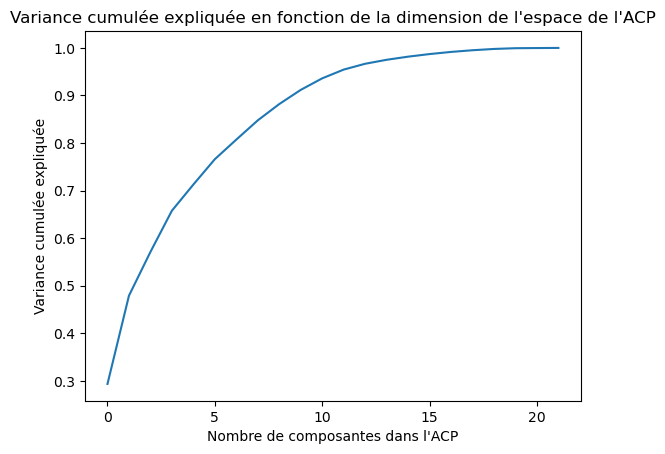

In [15]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

pca = PCA()
df_pca = pca.fit_transform(df_norm)

plt.plot(np.cumsum(pca.explained_variance_ratio_))

#Affichage de la variance expliquée en fonction du nombre de composantes dans l'ACP
plt.title('Variance cumulée expliquée en fonction de la dimension de l\'espace de l\'ACP')
plt.xlabel('Nombre de composantes dans l\'ACP')
plt.ylabel('Variance cumulée expliquée');

Ensuite, on utilise une fonction du package qui nous permet de savoir combien de composantes il nous faut garder afin d'estimer un certain pourcentage de la variance. Nous choisissons d'expliquer 85% de la variance ici. 

In [16]:
#Nombre de composantes nécessaires pour expliquer 85% de la variance
pca = PCA(0.85).fit(df_norm) 

#Affichage du nombre de composantes gardées pour l'ACP
pca.n_components_ 
print(f"on garde {pca.n_components_} composantes pour l'ACP")

on garde 9 composantes pour l'ACP


In [17]:
#ACP effectué sur le 9 composantes 
pca = PCA(n_components=pca.n_components_)

df_pca = pca.fit_transform(df_norm) 

#Affichage des dimensions du jeu de données avant et après ACP
print('--- ACP ---')
print('Dimension initiale :', df_norm.shape)
print('Dimension après projection:', df_pca.shape)

#Affichage des pourcentages de la variance expliquée pour chaque composante de l'ACP.
print('\n--- Variance expliquée ---')
print('Composante 1:', round(pca.explained_variance_[0],2), 'i.e.', round(100*pca.explained_variance_ratio_[0],2), '% de la variance totale')
print('Composante 2:', round(pca.explained_variance_[1],2), 'i.e.', round(100*pca.explained_variance_ratio_[1],2), '% de la variance totale')
print('Composante 3:', round(pca.explained_variance_[2],2), 'i.e.', round(100*pca.explained_variance_ratio_[2],2), '% de la variance totale')

--- ACP ---
Dimension initiale : (2868, 22)
Dimension après projection: (2868, 9)

--- Variance expliquée ---
Composante 1: 6.46 i.e. 29.36 % de la variance totale
Composante 2: 4.08 i.e. 18.55 % de la variance totale
Composante 3: 2.02 i.e. 9.2 % de la variance totale


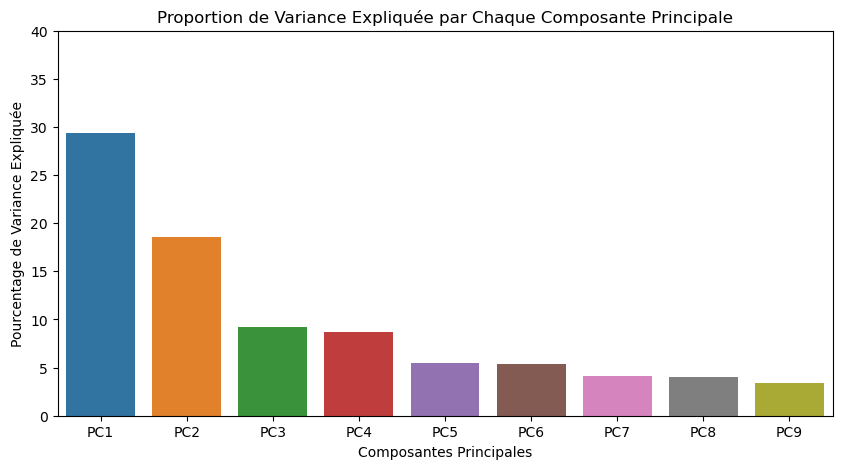

In [18]:
#Bar plot de la proportion de la variance expliquée par chaque composante de l'ACP
plt.figure(figsize=(10, 5))
sns.barplot(x=[f"PC{i+1}" for i in range(len(pca.explained_variance_ratio_))], y=pca.explained_variance_ratio_ * 100)
plt.xlabel("Composantes Principales")
plt.ylabel("Pourcentage de Variance Expliquée")
plt.title("Proportion de Variance Expliquée par Chaque Composante Principale")
plt.ylim(0, 40)  
plt.show()

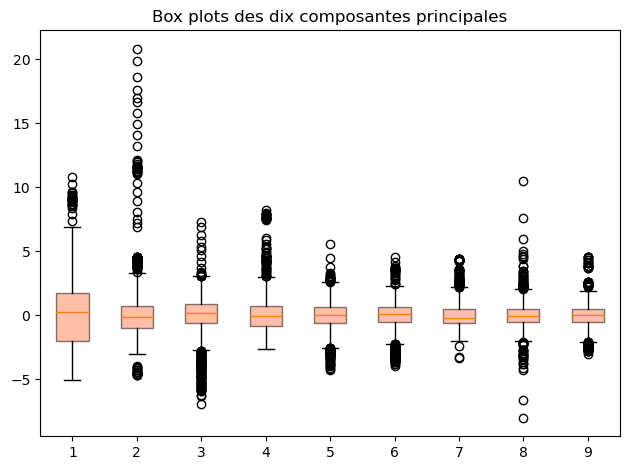

In [19]:
#Boxplot des composantes principales de l'ACP
box = plt.boxplot(df_pca[:,:10], patch_artist=True)
plt.setp(box["boxes"], facecolor="coral", alpha=.5)
plt.title("Box plots des dix composantes principales")
plt.tight_layout()
plt.show()

Ensuite, on projette nos données sur les axes des composantes principales de l'ACP, ici la composante 1 et 2.

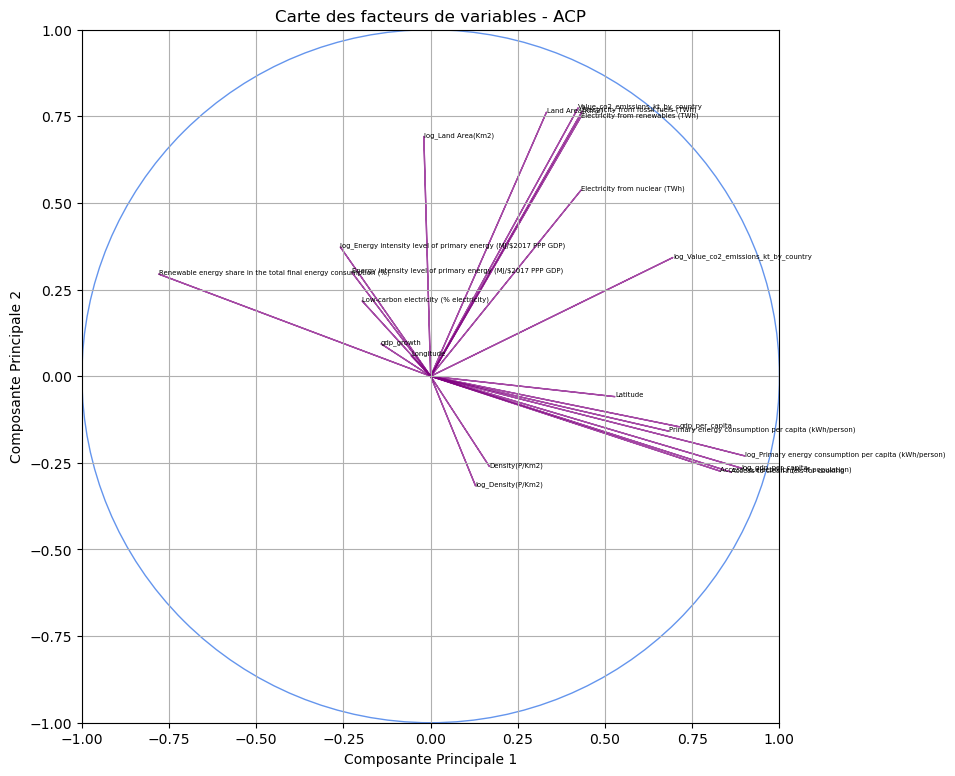

In [20]:
#Projection des données sur les composantes 1 et 2 de l'ACP
coord1 = pca.components_[0] * np.sqrt(pca.explained_variance_[0])
coord2 = pca.components_[1] * np.sqrt(pca.explained_variance_[1])

fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, df_norm.columns):
    plt.text(i, j, nom, fontsize=5)
    plt.arrow(0, 0, i, j, color = 'purple', alpha=0.7, width = 0.0001)

plt.axis((-1, 1, -1, 1))
plt.gcf().gca().add_artist(plt.Circle((0, 0), radius = 1, color = 'cornflowerblue', fill = False))

plt.title('Carte des facteurs de variables - ACP')
plt.xlabel('Composante Principale 1')
plt.ylabel('Composante Principale 2')

plt.grid(True)
plt.show()

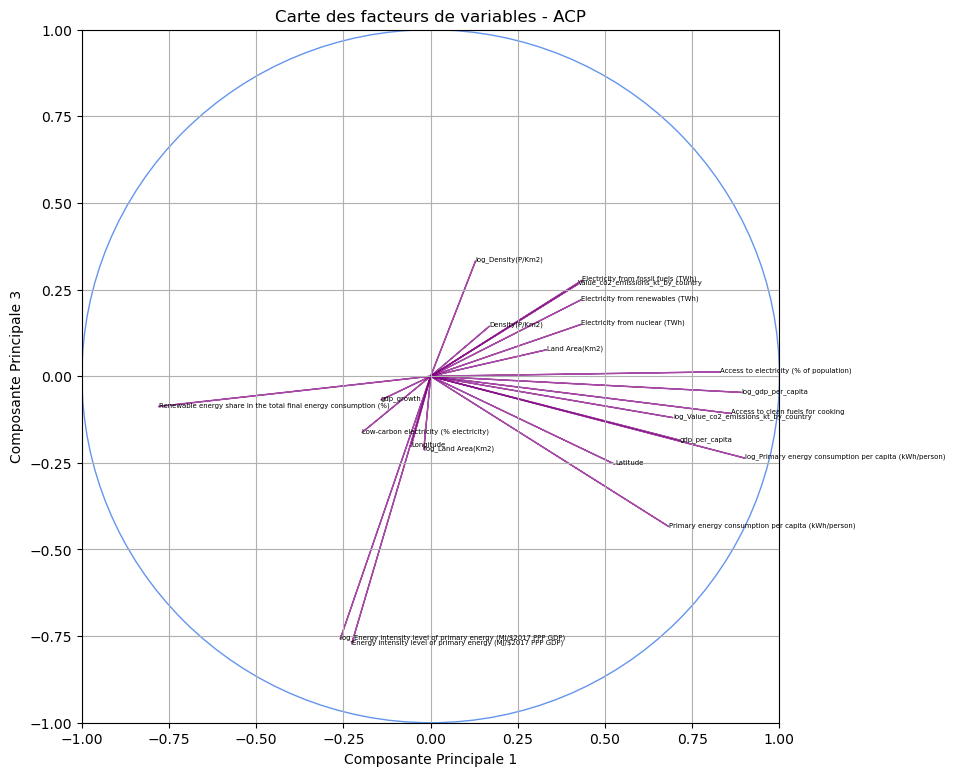

In [21]:
#Projection des données sur les composantes 1 et 3 de l'ACP
coord1 = pca.components_[0] * np.sqrt(pca.explained_variance_[0])
coord2 = pca.components_[2] * np.sqrt(pca.explained_variance_[2])

fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, df_norm.columns):
    plt.text(i, j, nom, fontsize=5)
    plt.arrow(0, 0, i, j, color = 'purple', alpha=0.7, width = 0.0001)

plt.axis((-1, 1, -1, 1))
plt.gcf().gca().add_artist(plt.Circle((0, 0), radius = 1, color = 'cornflowerblue', fill = False))

plt.title('Carte des facteurs de variables - ACP')
plt.xlabel('Composante Principale 1')
plt.ylabel('Composante Principale 3')

plt.grid(True)
plt.show()

L'analyse de l'ACP n'est pas si claire. Cependant, on peut retenir que dans le plan des composantes 1 et 2:
- Il y a des groupements de variables corrélées, dont un contenant la variable à prédire.
- La variable que l'on souhaite prédire est assez corrélée avec *'Electricity from renewables', 'Electricity from fuel' et 'Land Area'.*
- La variable à prédire est opposée selon la composante 2 à *'Acces to clean fuels for cooking', 'Primary energy consumption per capita'*. Cela semble logique car les énergies primaires sont définies comme énergies disponibles dans la nature, sans transformations et les combustibles propres sont connus pour emettre beaucoup moins de gaz à effets de serre.

Ces résultats font écho à nos analyses de la matrice de confusion.

Concernant l’ACP sur la variable transformée *'log_Value_co2_emissions_kt_by_country'* :
- On ne peut pas tirer de conclusions claires et précises concernant des potentiels liens avec la valeur *'log_Value_co2_emissions_kt_by_country'* sur les dimensions 1 et 2, celle-ci n'étant pas très bien projetée (car loin du bords du cercle).

- Sur la dimension 1 et 3 on peut émettre que la *'log_Value_co2_emissions_kt_by_country'* est un petit peu corrélées avec les variable *'Access to clean fuels for cooking'*, même si l'angle entre les deux vecteurs est non nul et qu'il faut donc prendre ces résultats avec des pincettes.

**8. Visualisez la possible dépendance entre la variable Year et la variable à prédire.**

Afin d'observer une potentielle dépendance entre les deux variables, on décide d'afficher les émissions en fonction des années.

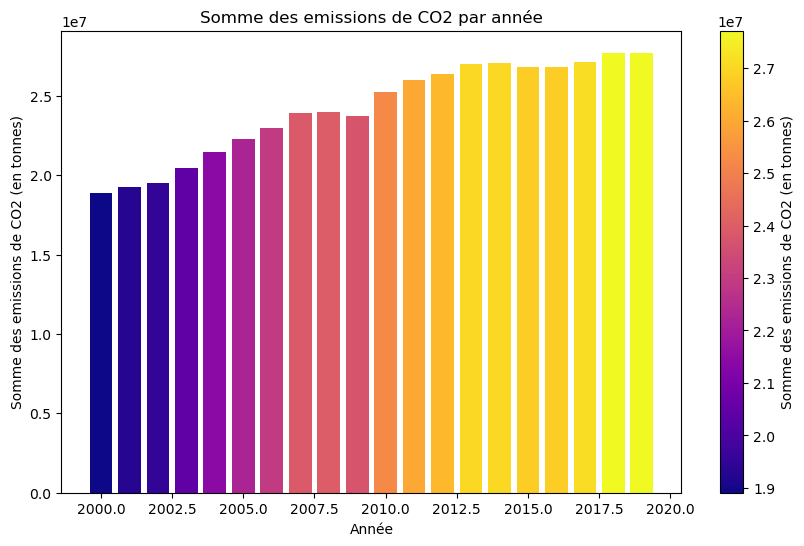

In [22]:
from matplotlib import colormaps
from matplotlib.cm import ScalarMappable

df_somme_annee = df.groupby('Year')['Value_co2_emissions_kt_by_country'].sum().reset_index()

#On enlève la dernière année (2020) car on avait que des na et donc la colonne est restée mais avec aucunes valeurs
df_somme_annee = df_somme_annee.drop(df_somme_annee.index[-1])

cmap = plt.get_cmap('plasma')

# Normalisation des valeurs pour correspondre à la colormap
norm = plt.Normalize(df_somme_annee['Value_co2_emissions_kt_by_country'].min(), df_somme_annee['Value_co2_emissions_kt_by_country'].max())

plt.figure(figsize=(10, 6))
plt.bar(df_somme_annee['Year'],df_somme_annee['Value_co2_emissions_kt_by_country'],color=cmap(norm(df_somme_annee['Value_co2_emissions_kt_by_country'])))
plt.xlabel('Année')
plt.ylabel('Somme des emissions de CO2 (en tonnes)')
plt.title('Somme des emissions de CO2 par année')


# Création de l'objet mappable
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Ajout de l'argument ax pour spécifier les axes
cbar = plt.colorbar(sm, ax=plt.gca())
cbar.set_label('Somme des emissions de CO2 (en tonnes)')

plt.show()

On remarque que les émissions de CO2 sont corrélées avec l'année observée. En effet, ces dernières semblent malheureusement augmenter avec le temps.

# Modélisation

Nous nous intéressons maintenant à la prédiction de la variable quantitative *'Value_co2_emissions_kt_by_country'*.

**1. Divisez le jeu de données sans données manquantes en un échantillon d’apprentissage et un échantillon test. Vous prendrez un pourcentage de 20% pour l’échantillon test. Pourquoi cette étape est-elle nécessaire lorsque nous nous concentrons sur les performances des algorithmes ?**

Cette étape, réalisée ci-dessous, est crutiale pour évaluer les performances des algorithmes car deux jeux de données différents nous permettent d'évaluer différentes erreurs des modèles. Par exemple, le training set, nous servira d'entraînement et permettra d'évaluer l'erreur d'ajustement, tandis que le test set nous permettra de calculer l'erreur de généralisation.

Aussi, nous allons tester nos modèles sur *'Value_co2_emissions_kt_by_country'* ainsi que sa transformation logarithmique, ce qui nous demande de créer deux variables y.

Pour finir, la variable *'Electricity from fossil fuels (TWh)'* étant très corrélée avec la variable à prédire, nous décidons de la retirer du jeu de données.

In [142]:
from sklearn.model_selection import train_test_split

#Suppression des variables citées ci-dessus
X = df.drop(["Value_co2_emissions_kt_by_country",
             "log_Value_co2_emissions_kt_by_country",
             'Electricity from fossil fuels (TWh)'], axis=1)
y = df['Value_co2_emissions_kt_by_country']

#Création de nos échantillon train (80% des données) et test (20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

log_y_train = np.log(y_train)
log_y_test = np.log(y_test)

#Vérification de la taille de nos échantillons
print('Taille des échantillons :')
print('X_train :', len(X_train)) 
print('X_test :', len(X_test)) 
print('y_train :', len(y_train)) 
print('y_test :', len(y_test)) 

Taille des échantillons :
X_train : 2294
X_test : 574
y_train : 2294
y_test : 574


**2. Comparez les performances d’un modèle de régression linéaire avec/sans sélection de variables, avec/sans pénalisation, d’un SVM, d’un arbre optimal, d’une forêt aléatoire, du boosting, et de réseaux de neurones. Justifiez vos choix (par exemple le noyau pour le SVM), et ajustez soigneusement les paramètres (par validation croisée). Interprétez les résultats et quantifiez l’amélioration éventuelle apportée par les modèles non linéaires.**

**2. a) Modèle de régression linéaire sans pénalisation :**

Pour un modèle de régression linéaire, seules les variables quantitatives interviennent. C'est pour cela que nous décidons de retirer les colonnes *'Entity'* et *'Year'* du jeu de données.

In [143]:
#Suppression des données qualitatives
X_train = X_train.drop(['Entity','Year'],axis=1)
X_test = X_test.drop(['Entity','Year'],axis=1)

#Standardisation de notre jeu de données
scaler = StandardScaler()  
scaler.fit(X_train)  
X_train = pd.DataFrame(scaler.transform(X_train),columns=X_train.columns)

# Meme transformation sur le test
X_test = pd.DataFrame(scaler.transform(X_test),columns=X_train.columns)

On créé un modèle afin de prédire, dans un premier temps, *'Value_co2_emissions_kt_by_country'*.

In [144]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

#on réalise un modèle linéaire simple sur nos données d'entraînement 
reg_no_log = LinearRegression().fit(X_train, y_train)

#on affiche le score d'ajustement du modèle
print("Score d'ajustement :",reg_no_log.score(X_train, y_train))

#on teste le modèle de prédiction sur notre échantillon test
prediction = reg_no_log.predict(X_test)

#on affiche l'erreur du modèle entre les valeurs qu'ils prédisent et celles observées.
print("MSE de généralisation :",mean_squared_error(y_test,prediction))

Score d'ajustement : 0.8229571616203143
MSE de généralisation : 129963550922.38774


De la même manière, on créé un modèle pour prédire la transformée logarithmique de *'Value_co2_emissions_kt_by_country'.*

In [145]:
#on réalise un modèle linéaire simple sur nos données d'entrainement 
reg = LinearRegression().fit(X_train, log_y_train)

#on affiche le score d'ajustement du modèle
print("Score d'ajustement :",reg.score(X_train, log_y_train))

#on teste le modèle de prédiction sur notre échantillon test
prediction = reg.predict(X_test)

#on affiche l'erreur du modèle entre les valeurs qu'ils prédisent et celles observées.
print("MSE de généralisation :",mean_squared_error(log_y_test,prediction))

Score d'ajustement : 0.9839654289933876
MSE de généralisation : 0.12545733959143707


Nous observons un meilleur score d'ajustement lorsque nous prédisons le logarithme de *'Value_co2_emissions_kt_by_country'* plutôt que *'Value_co2_emissions_kt_by_country'*. De plus le Mean Square Error (MSE) de généralisation de la variable log est plus faible donc plus facile à interpréter. Nous déciderons par la suite de prédire uniquement log_y_train et log_y_test.

Text(0.5, 1.0, 'Coefficients du modèle linéaire')

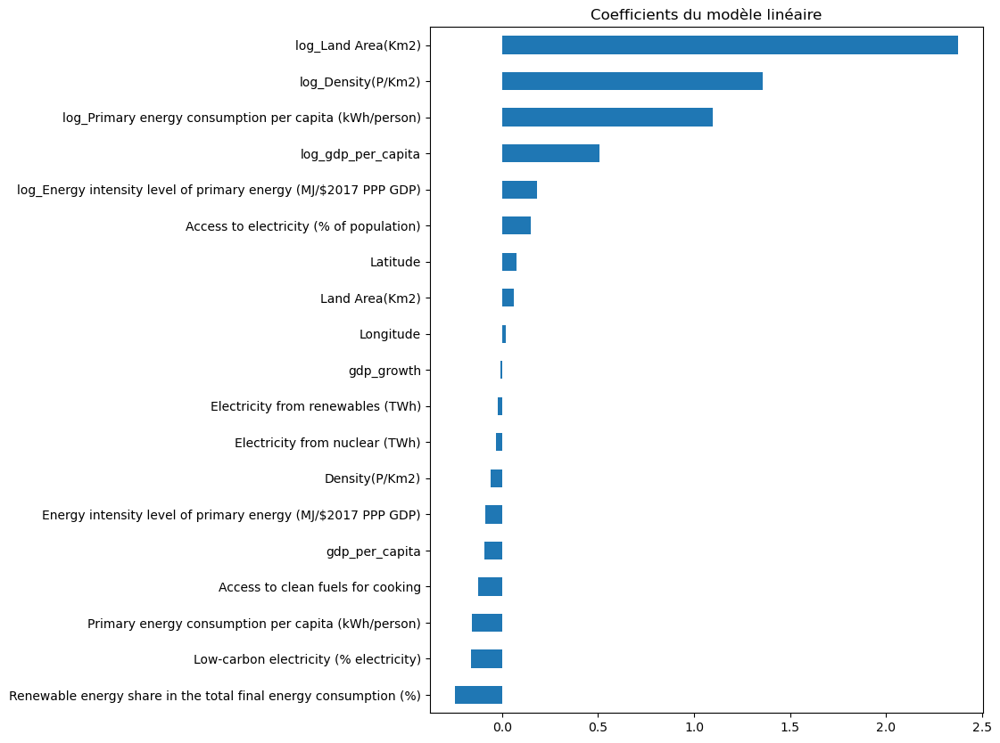

In [146]:
#Affichage des coefficients du modèle linéaire de la variable 'log_value_c02'
#Utilisée pour répondre à la Q4 
coef = pd.Series(reg.coef_, index=X_train.columns)
imp_coef = coef.sort_values()
plt.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
plt.title(u"Coefficients du modèle linéaire") 

**2. b) Modèle linaire avec pénalisation LASSO**

Nous réalisons maintenant un modèle linéaire avec pénalisation LASSO, ce qui revient à pénaliser par la norme l1. Dans ce type de modèle, il nous faut optimiser le tuning paramètre 'alpha', ce que nous faisons par validation croisée. 

In [147]:
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV

# grille de valeurs du paramètre alpha à optimiser
param=[{"alpha":[0.005,0.01,0.05,0.1,0.3,0.5,1,2,5,10]}]

#Optimisation des paramètres par validation croisée
regLasso = GridSearchCV(linear_model.Lasso(), param,cv=10,n_jobs=-1)

#Entraînement du modèle avec notre training set et les paramètres optimisés
regLassOpt=regLasso.fit(X_train, log_y_train)

# paramètre optimal
regLassOpt.best_params_["alpha"]#print("Meilleur paramètre : alpha = %s, et donne un R2 = %f." % (regLassOpt.best_params_["alpha"],regLassOpt.best_score_))

# coefficients du modèle
coef = pd.Series(regLassOpt.best_estimator_.coef_, index=X_train.columns)
print("Lasso conserve ", str(sum(coef != 0)), " variables et en supprime ", str(sum(coef == 0)))

Lasso conserve  18  variables et en supprime  1


On calcule les performances de notre modèle :

In [148]:
#on teste le modèle de prédiction sur notre échantillon train
#on affiche le score d'ajustement du modèle
prediction_train = regLassOpt.predict(X_train)
print("MSE d'ajustement :",mean_squared_error(log_y_train,prediction_train))

#Test du modèle sur test set et affichage de l'erreur de généralisation
prediction_test = regLassOpt.predict(X_test)
print("MSE de généralisation :",mean_squared_error(log_y_test,prediction_test))

MSE d'ajustement : 0.0940251250809481
MSE de généralisation : 0.1254753400865244


Text(0.5, 1.0, 'Coefficients du modèle LASSO')

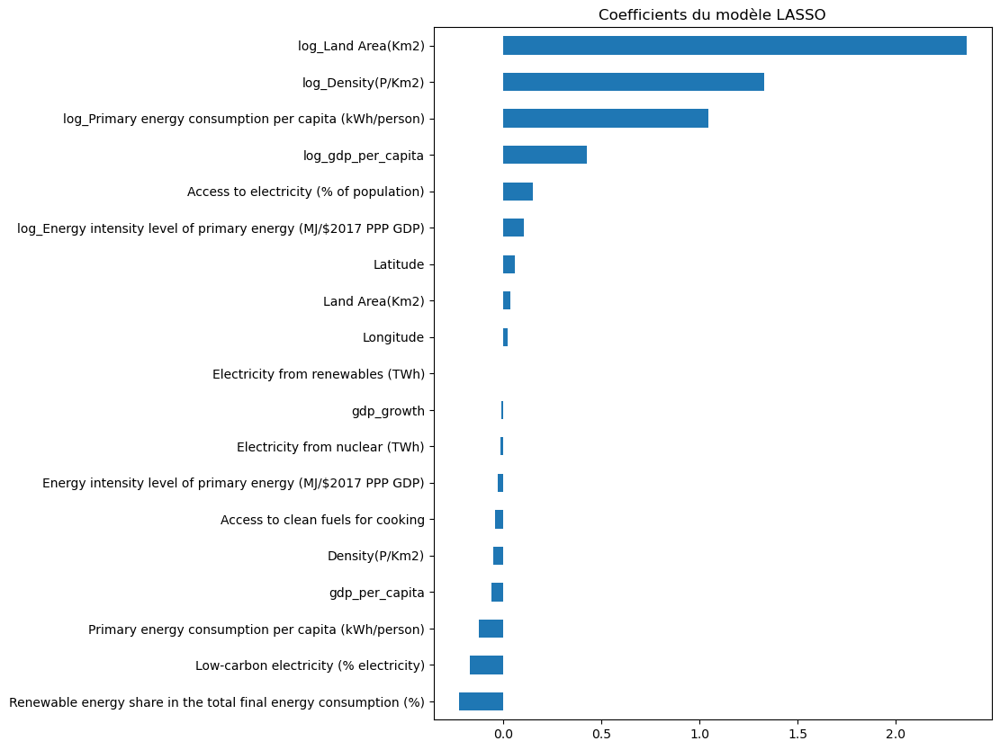

In [149]:
#Affichage des coefficients du modèle linéaire avec pénalisation LASSO de la variable 'log_value_c02'
#Utilisée pour répondre à la Q4 

imp_coef = coef.sort_values()
plt.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
plt.title(u"Coefficients du modèle LASSO") 

Par validation croisée, on trouve que la valeur de l'hyperparamètre pénalisant la norme l1 optimale est $\alpha=0.005$, ce qui est très faible. Cela explique que peu de valeurs du modèle conservé sont mises à 0, et que la valeur des coefficients pour le modèle LASSO sont proches des coefficients du la régression linéaire.

**2. c) Modèle linéaire avec pénalisation selon le critère AIC**

Nous réalisons maintenant un modèle de sélection de variables avec le critère AIC :

In [150]:
"""import statsmodels.api as sm
from itertools import combinations

def calculate_aic(model):
    return model.aic

def best_subset_selection(X, y):
    # This function performs best subset selection based on AIC
    # It returns the model with the lowest AIC and the corresponding variables
    
    X = sm.add_constant(X)  # Add a constant column for the intercept
    best_aic = np.inf
    best_model = None
    best_features = None

    # Iterate over all possible combinations of the columns in X
    for k in range(1, len(X.columns) + 1):
        print(k)
        for combo in combinations(X.columns[1:], k):  # Skip the constant column for combinations
            combo = ('const',) + combo  # Include the constant column in the combination
            X_subset = X[list(combo)]
            model = sm.OLS(list(y), X_subset).fit()
            aic = calculate_aic(model)
            if aic < best_aic:
                best_aic = aic
                best_model = model
                best_features = combo

    return best_model, best_features

# Exemple d'utilisation avec X_train et log_y_train
# Assurez-vous que X_train et log_y_train sont des DataFrames ou Series Pandas

# X_train : DataFrame des variables indépendantes
# log_y_train : Série des variables dépendantes transformées (logarithme dans ce cas)

# Appel de la fonction pour trouver le meilleur modèle
best_model, best_features = best_subset_selection(X_train, log_y_train)

# Affichage des résultats
print("Meilleur modèle selon le critère AIC:")
print("AIC:", best_model.aic)
print("Variables sélectionnées:", best_features)
print(best_model.summary())"""

print('Meilleur modèle selon le critère AIC:')
print('AIC: 1060.5130926549527')
print("Variables sélectionnées: ('const', 'Access to electricity (% of population)', 'Access to clean fuels for cooking', 'Renewable energy share in the total final energy consumption (%)', 'Electricity from nuclear (TWh)', 'Electricity from renewables (TWh)', 'Low-carbon electricity (% electricity)', 'Primary energy consumption per capita (kWh/person)', 'Energy intensity level of primary energy (MJ/$2017 PPP GDP)', 'gdp_growth', 'gdp_per_capita', 'Density(P/Km2)', 'Land Area(Km2)', 'Latitude', 'Longitude', 'log_Primary energy consumption per capita (kWh/person)', 'log_Energy intensity level of primary energy (MJ/$2017 PPP GDP)', 'log_gdp_per_capita', 'log_Density(P/Km2)', 'log_Land Area(Km2)')")

Meilleur modèle selon le critère AIC:
AIC: 1060.5130926549527
Variables sélectionnées: ('const', 'Access to electricity (% of population)', 'Access to clean fuels for cooking', 'Renewable energy share in the total final energy consumption (%)', 'Electricity from nuclear (TWh)', 'Electricity from renewables (TWh)', 'Low-carbon electricity (% electricity)', 'Primary energy consumption per capita (kWh/person)', 'Energy intensity level of primary energy (MJ/$2017 PPP GDP)', 'gdp_growth', 'gdp_per_capita', 'Density(P/Km2)', 'Land Area(Km2)', 'Latitude', 'Longitude', 'log_Primary energy consumption per capita (kWh/person)', 'log_Energy intensity level of primary energy (MJ/$2017 PPP GDP)', 'log_gdp_per_capita', 'log_Density(P/Km2)', 'log_Land Area(Km2)')


On remarque que le modèle avec le meilleur AIC est le modèle complet, ce qui revient donc à faire un modèle linéaire sans sélection de variable.

## Support Vector Machine (SVM)

Nous souhaitons étudier la méthode de la SVM sur nos données. Il faut être attentif ici au fait que la méthode SVM s'applique sur des données standardisées, car elle met en jeu des notions de distances entre les points, qui peuvent être faussées par les diverses unités de nos variables. Or, debut le début du projet, nous avons fait attention de n'utiliser que des données standardisés, nous pouvons donc utiliser le même jeu de données.

Nous sommes dans le cas d'une régression, donc on utilise le package SVR.

In [151]:
from sklearn.svm import SVR

La méthode SVM fait intervenir la présence d'un 'noyau'. Ce noyau est défini comme le produit scalaire des entrées projetées dans l'espace complet H de dimension supérieure. Il est de existe plusieurs formes de produits scalaires et donc plusieurs noyaux. 
(je peux mettre des formules de produits scalaires svv)
- le noyau 'linéaire' :
- le noyau 'polynomial' : 
- le noyau 'radial' :

Nous commençons par tester le noyau dit "linéaire". Nous optimisons nos paramètres de tuning par validation croisée. Dans ce premier cas les paramètres de tuning se résument au coefficient de coût que l'on note 'C'. Nous avons réalisé les compilations préalablement car celles-ci sont très longues. L'optimisation de nos paramètres de tuning par validation croisée, nous donne ces résultats : "**Meilleur score = 0.982978, Meilleur paramètre = {'C': 0.1}**".

In [152]:
"""
#svm_linear = SVR(kernel='linear')  # Utilisation du noyau linéaire
# ou
#svm_poly = SVR(kernel='poly')  # Utilisation du noyau polynomial
# ou
#svm_rbf = SVR(kernel='rbf')  # Utilisation du noyau RBF (par défaut)

# Premier cas : noyau lineaire

#Paramètre tuning de notre algorithme :
param=[{"C":[0.1,1,10]}]

# Optimisation des paramètres par validation croisée
svm = GridSearchCV(SVR(kernel='linear'), param, cv=10, n_jobs=-1)

#Entraînement du modèle avec notre training set et les paramètres optimisés
svmOpt = svm.fit(X_train, log_y_train)

# Affichage paramètre optimal
print("Meilleur score = %f, Meilleur paramètre = %s" % (svmOpt.best_score_,svmOpt.best_params_))"""
#Meilleur score = 0.982978, Meilleur paramètre = {'C': 0.1}

svmLinOpt = SVR(kernel='linear',C=0.1).fit(X_train, log_y_train)

On calcule les performances de notre modèle :

In [153]:
#on affiche le score d'ajustement du modèle après l'avoir entraîné sur le traininn set
prediction_train = svmLinOpt.predict(X_train)
print("MSE d'ajustement :",mean_squared_error(log_y_train,prediction_train))

#Test du modèle sur test set et affichage de l'erreur de généralisation
prediction_test = svmLinOpt.predict(X_test)
print("MSE de généralisation :",mean_squared_error(log_y_test,prediction_test))

MSE d'ajustement : 0.0946960863542193
MSE de généralisation : 0.13491919446919623


On teste désormais le noyau polynomial. On optimise également les paramètres de tuning par validation croisée, ici il s'agit du coût 'C', 'degree', 'gamma', 'coef0'. De même, nous avons réalisé les compilations préalablement car celles-ci sont très longues. L'optimisation de nos paramètres de tuning par validation croisée, nous donne ces résultats : "**Meilleur score = 0.995629, Meilleur paramètre = {'C': 10, 'coef0': 0.5, 'degree': 3, 'gamma'= 'scale'}**
".

In [154]:
"""#Deuxieme cas : noyau polynomial 

#Paramètres tuning de notre algorithme :

param=[{"C":[0.1,1,10,100],
        'degree':[3,5,7],
        'gamma':['scale', 'auto'],
        'coef0':[0,0.1,0.5]}]

# Optimisation des paramètres par validation croisée
svm = GridSearchCV(SVR(kernel='poly'), param, cv=10, n_jobs=-1)

#Entraînement du modèle avec notre training set et les paramètres optimisés
svmOpt = svm.fit(X_train, log_y_train)

# paramètres optimaux
print("Meilleur score = %f, Meilleur paramètre = %s" % (svmOpt.best_score_,svmOpt.best_params_))"""
#Meilleur score = 0.995629, Meilleur paramètre = {'C': 10, 'coef0': 0.5, 'degree': 3, 'gamma'= 'scale'}

svmPolyOpt = SVR(kernel='poly',C=10,coef0=0.5,degree=3,gamma='scale').fit(X_train, log_y_train)


On calcule les performances de notre modèle :

In [155]:
#on affiche le score d'ajustement du modèle après l'avoir entraîné sur le traininn set
prediction_train = svmPolyOpt.predict(X_train)
print("MSE d'ajustement :",mean_squared_error(log_y_train,prediction_train))

#Test du modèle sur test set et affichage de l'erreur de généralisation
prediction_test = svmPolyOpt.predict(X_test)
print("MSE de généralisation :",mean_squared_error(log_y_test,prediction_test))

MSE d'ajustement : 0.011478483982401281
MSE de généralisation : 0.023610035693361897


Enfin, on étudie le noyau "radial", on optimise les paramètres de tuning suivant : le coût 'C', "epsilon" et "gamma". De même, nous avons réalisé les compilations préalablement car celles-ci sont très longues. L'optimisation de nos paramètres de tuning par validation croisée, nous donne ces résultats : "**Meilleur score = 0.988836, Meilleur paramètre = {'C': 500, 'epsilon': 0.01, 'gamma': 'scale'}** ".

In [156]:
"""
#Paramètres tuning de notre algorithme :
param=[{"C":[7,15,30,50,100,500],
        "gamma":['scale','auto'],
        "epsilon":[0.005,0.01,0.1,0.5]}]

# Optimisation des paramètres par validation croisée
svm = GridSearchCV(SVR(), param, cv=10, n_jobs=-1)

svmOpt = svm.fit(X_train, log_y_train)
# paramètre optimal
print("Meilleur score = %f, Meilleur paramètre = %s" % (svmOpt.best_score_,svmOpt.best_params_))"""
#Meilleur score = 0.988836, Meilleur paramètre = {'C': 500, 'epsilon': 0.01, 'gamma': 'scale'}

svm = SVR(C=500, epsilon=0.01, gamma='scale')

#Entraînement du modèle avec notre training set et les paramètres optimisés
svmGaussOpt = svm.fit(X_train, log_y_train)


On calcule les performances de notre modèle :

In [157]:
#on affiche le score d'ajustement du modèle après l'avoir entraîné sur le traininn set
prediction_train = svmGaussOpt.predict(X_train)
print("MSE d'ajustement :",mean_squared_error(log_y_train,prediction_train))

#Test du modèle sur test set et affichage de l'erreur de généralisation
prediction_test = svmGaussOpt.predict(X_test)
print("MSE de généralisation :",mean_squared_error(log_y_test,prediction_test))

MSE d'ajustement : 0.001983166970717649
MSE de généralisation : 0.0469254703251938


ANALYSE : 
--> très bon résidus (ne pas oublier de prendre l'échantillon standardisé ca change tout ahah)

Globalement, on obtient de meilleur résultat avec le noyau 'polynomial'. En effet, l'erreur de généralisation est deux fois moins importante pour le noyau polynomial que pour le noyau 'radial'.

## ARBRE DE REGRESSION


On tente désormais une autre méthode afin de prédire nos valeurs d'émission de C02 : l'arbre de régression.
Il s'agit globalement d'un diagramme simple de prise de décision, qui permet, dans notre cas, de prédire nos valeurs d'émissions de C02.

Une remarque importante est qu'il ne faut pas standardiser nos données pour cette méthode. Car elle n'est pas sensible aux unités des variables, ne se basant pas sur des notions de distances.

Pour cela, on se sert du package DecisionTreeRegressor car on est dans le cas de la régression. Ici encore on optimise nos paramètres de tuning afin d'avoir le meilleur modèle possible. Cette optimisation se fait ici encore par validation croisée.

Les paramètres à optimiser sont : 
 - 'splitter' : il s'agit de la stratégie utilisée pour choisir la répartition à chaque nœud. Il existe l'option "best" pour choisir la meilleure division et "random" pour choisir la meilleure division aléatoire.
 - 'max_depth': il s'agit de la profondeur maximale de l'arbre.
 - 'min_samples_leaf': c'est le nombre minimum d'échantillons requis pour diviser un noeud interne
 - 'min_weight_fraction_leaf': il s'agit de la fraction pondérée minimale de la somme totale des poids requise pour être à un nœud feuille. 
 - 'max_features' : nombre de caractéristiques à prendre en compte lors de la recherche de la meilleure fente :
 - 'max_leaf_nodes': nombre maximum de noeuds.
 
 Ici encore, nous avons fait compiler l'optimisation des paramètres de façon préalable, on obtient : "**Meilleur score = 0.706866, Meilleur paramètre = {'max_depth': 5, 'max_features': None, 'max_leaf_nodes': 50, 'min_samples_leaf': 6, 'min_weight_fraction_leaf': 0.1, 'splitter': 'best'}**".


In [158]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
"""
#Paramètres tuning de notre modèle :
param={"splitter":["best","random"],
       "max_depth" : [1,3,5,7,9,11,12],
       "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
       "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5],
       "max_features":["log2","sqrt",None],
       "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }

# Optimisation des paramètres par validation croisée
tree= GridSearchCV(DecisionTreeRegressor(),param,cv=10,n_jobs=-1)

#Entraînement du modèle avec notre training set et les paramètres optimisés
treeOpt=tree.fit(X_train, log_y_train)

# on affiche les meilleurs paramètres qui découlent de la validation croisée
print("Meilleur score = %f, Meilleur paramètre = %s" % (treeOpt.best_score_,treeOpt.best_params_))
"""

tree = DecisionTreeRegressor(max_depth = 5, max_features = None, max_leaf_nodes = 50, min_samples_leaf = 6, min_weight_fraction_leaf = 0.1, splitter = 'best')

#Entraînement du modèle avec notre training set et les paramètres optimisés
treeOpt=tree.fit(X_train, log_y_train)

# on prédit les valeurs sur l'ensemble de test
predictions = treeOpt.predict(X_test)

# on calcule le score sur l'ensemble de test (par exemple, l'erreur quadratique moyenne)
mse = mean_squared_error(log_y_test, predictions)
print("Erreur quadratique moyenne sur l'ensemble de test:", mse)

#Meilleur score = 0.706866, Meilleur paramètre = {'max_depth': 5, 'max_features': None, 'max_leaf_nodes': 50, 'min_samples_leaf': 6, 'min_weight_fraction_leaf': 0.1, 'splitter': 'best'}
#Erreur quadratique moyenne sur l'ensemble de test: 1.7941451998985531

Erreur quadratique moyenne sur l'ensemble de test: 1.7941451998985536


Affichons désormais l'arbre de régression obtenu pour avoir un rendu plus visuel et interprétable.

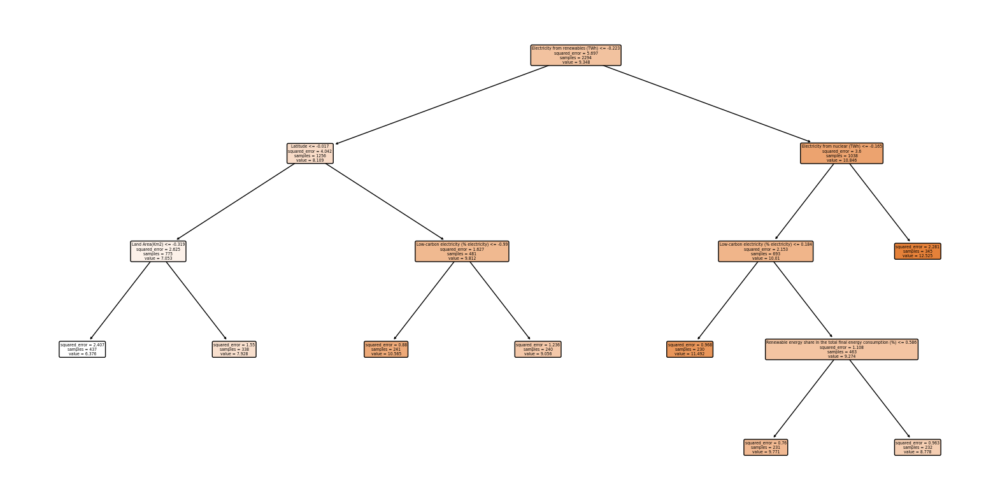

In [159]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Affichage l'arbre de décision 
plt.figure(figsize=(20,10))
plot_tree(treeOpt, feature_names=X_train.columns, filled=True, rounded=True)
plt.show()

On calcule les performances de notre modèle :

In [160]:
#on affiche le score d'ajustement du modèle après l'avoir entraîné sur le traininn set
prediction_train = treeOpt.predict(X_train)
print("MSE d'ajustement :",mean_squared_error(log_y_train,prediction_train))

#Test du modèle sur test set et affichage de l'erreur de généralisation
prediction_test = treeOpt.predict(X_test)
print("MSE de généralisation :",mean_squared_error(log_y_test,prediction_test))

MSE d'ajustement : 1.5226378045701698
MSE de généralisation : 1.7941451998985536


On affiche les résidus du modèle obtenus par rapport au training set :
=> expliquer ou avoir expliqué + ht la diff residus training et test set

# Forêt aléatoire

Implémentons la méthode de Random Forest afin de prédire notre variables. Il s'agit d'un algortithme combinant la méthode des arbres de régression et de l'algorithme de Bagging. Il contruit un grand nombre d'arbres de décision où chaque arbre est formé à l'aide d'un échantillon bootstrap des données et en sélectionnant un sous-ensemble aléatoire de variables à chaque nœud de décision. Les prédictions finales sont obtenues en agrégeant les prédictions de tous les arbres, généralement par une moyenne pour les problèmes de régression.

Les paramètres à optimiser sont le nombre d'arbres que possède notre forêt.

Les compilations de l'optimisation des paramètres de tuning, par validation croisée, nous donne : "**{'n_estimators': 1000}**".

In [161]:

from sklearn.ensemble import RandomForestRegressor

# Création & entraînement du modèle de Random Forest
"""
param=[{"n_estimators" : [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]}]
random_forest = GridSearchCV(RandomForestRegressor(criterion='squared_error',bootstrap=True, oob_score=True),param,cv=10)
random_forest.fit(X_train, log_y_train)
print(random_forest.best_params_)"""
#random_forest.best_params_ = {'n_estimators': 1000}

random_forest = RandomForestRegressor(n_estimators=1000,criterion='squared_error',bootstrap=True, oob_score=True).fit(X_train, log_y_train)

On calcule les performances de ce modèle :

In [162]:
#Affichage du score d'ajustement du modèle après l'avoir entraîné sur le traininn set
prediction_train = random_forest.predict(X_train)
print("MSE d'ajustement :",mean_squared_error(log_y_train,prediction_train))

#Test du modèle sur test set et affichage de l'erreur de généralisation
prediction_test = random_forest.predict(X_test)
print("MSE de généralisation :",mean_squared_error(log_y_test,prediction_test))

MSE d'ajustement : 0.002886724001605387
MSE de généralisation : 0.022540850339246958


Le modèle Random Forest donne souvent de bons résultats, cependant il reste un modèle très complexe à interpréter. Ainsi,  nous calculons l'indicateur Mean Decrease Impurity (MDI).  Cet indicateur mesure la réduction totale de l'impureté apportée par chaque variable sur l'ensemble des arbres de la forêt. On interprétera l'importance des variables dans la suite par la Q4.

Electricity from renewables (TWh) 0.3709703974258243
Latitude 0.17431532779270364
Electricity from nuclear (TWh) 0.13386826380786623
Low-carbon electricity (% electricity) 0.10900184189764243
Renewable energy share in the total final energy consumption (%) 0.0417974750531317
log_Land Area(Km2) 0.03428570385797273
Land Area(Km2) 0.03318306535718415
Primary energy consumption per capita (kWh/person) 0.021902604862852084
log_Primary energy consumption per capita (kWh/person) 0.0217788097438777
log_Density(P/Km2) 0.010213012635725188
Density(P/Km2) 0.010198214086543157
Access to electricity (% of population) 0.00833732853270413
Longitude 0.007586735283649707
Access to clean fuels for cooking 0.004936410161921165
Energy intensity level of primary energy (MJ/$2017 PPP GDP) 0.004664945447441153
log_Energy intensity level of primary energy (MJ/$2017 PPP GDP) 0.004441120478002289
gdp_per_capita 0.004027460032658852
log_gdp_per_capita 0.003623203213894688
gdp_growth 0.0008680803284047419


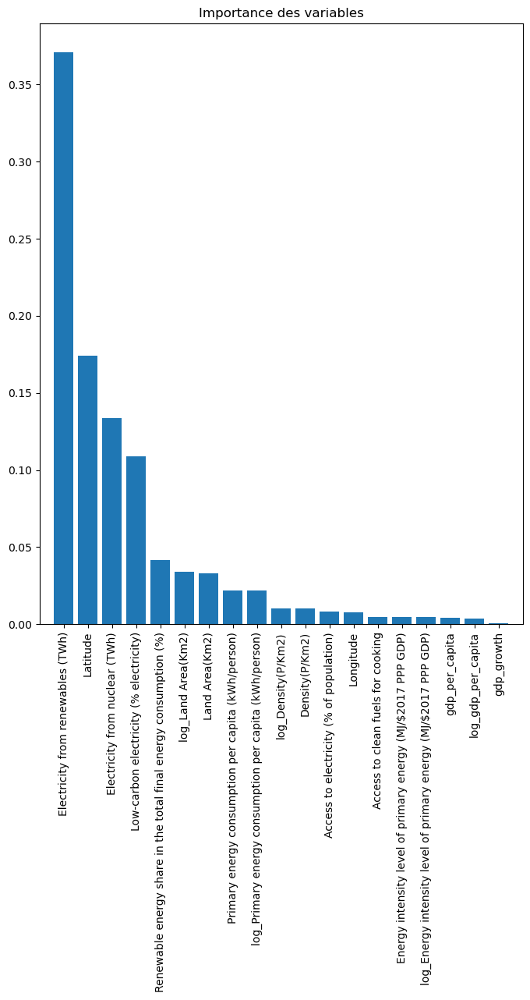

In [163]:
#Calcul de l'indicateur MDI de la forêt aléatoire
rfFit=random_forest.fit(X_train, log_y_train)

# Importance décroissante des variables
importances = rfFit.feature_importances_
indices = np.argsort(importances)[::-1]
for f in range(X_train.shape[1]):
    print(X_train.columns[indices[f]], importances[indices[f]])
    
# Graphe des importances
plt.figure()
plt.title("Importance des variables")
plt.bar(range(X_train.shape[1]), importances[indices]);
plt.xticks(range(X_train.shape[1]), X_train.columns[indices],rotation=90);
plt.xlim([-1, X_train.shape[1]]);
plt.show()

## Boosting 

On implémente un nouveau modèle : le boosting. Ce modèle suit une méthode qui construit un modèle prédictif puissant en ajoutant successivement des modèles simples, appelés apprenants faibles, de manière à corriger les erreurs des modèles précédents. 

On utilise ici l'algorithme du Gradient_Boosting issu de la library 'GradientBoostingRegressor', cet algorithme fonctionne en combinant plusieurs arbres de décision simples qui joue le rôle d'apprenants faibles. Les hyper-paramètres à optimiser sont :
 - 'n_estimators': le nombre d'arbres. 
 - 'learning_rate': le taux d'apprentissage. 
 - 'max_depth': la profondeur maximale des arbres
 
 La validation croisée nous donne ces résultats : "**Meilleurs paramètres: {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 1000}'"**.


In [164]:
from sklearn.ensemble import GradientBoostingRegressor

# Création du modèle Gradient Boosting Regressor
gbr = GradientBoostingRegressor

"""
# Définir la grille des hyperparamètres à tester
param_grid = {
    'n_estimators': [100, 500, 1000],
    'learning_rate': [0.01, 0.1, 0.5],
    'max_depth': [2, 3, 4, 5]
}

# Configurer la recherche en grille
grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=10, n_jobs=-1)
# Exécuter la recherche en grille sur les données d'entraînement
grid_search.fit(X_train, log_y_train)

# Meilleurs hyperparamètres trouvés
print(f"Best parameters found: {grid_search.best_params_}")

# Utiliser les meilleurs hyperparamètres pour faire des prédictions
best_gbr = grid_search.best_estimator_
"""
#Meilleurs paramètres: {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 1000}

best_gbr = gbr(learning_rate = 0.1, max_depth = 4, n_estimators = 1000).fit(X_train,log_y_train)

On calcule les performances du modèle :

In [165]:
#Affichage du score d'ajustement du modèle après l'avoir entraîné sur le traininn set
prediction_train = best_gbr.predict(X_train)
print("MSE d'ajustement :",mean_squared_error(log_y_train,prediction_train))

#Test du modèle sur test set et affichage de l'erreur de généralisation
prediction_test = best_gbr.predict(X_test)
print("MSE de généralisation :",mean_squared_error(log_y_test,prediction_test))

MSE d'ajustement : 0.0005335362932825974
MSE de généralisation : 0.03005227967620338


## Réseaux de neurones 

Enfin, on prédit notre modèle en utilisant l'algorithme des réseaux de neurones. Cette méthode consiste à générer un grand nombre d’arbres de décision et à effectuer des moyennes ou des « règles de majorité » à la fin du processus pour prédire la variable voulue. 

Remarque : ici encore il n'est pas nécessaire de standardiser nos données car cet algorithme ne fait pas appelle à des notions de distance entre des points, cepedendant nous gardons notre jeu de données déjà standardiser pour créer et entraîner nos modèles sur le même jeu de données.

In [166]:
#on importe le package MLRegressor
from sklearn.neural_network import MLPRegressor

On optimise nos paramètres tuning, qui sont : 
 - 'hidden_layer_sizes': représente le nombre de neurones dans la ième couche cachée.
 - 'activation': permet de choisir la fe ième élément représente le nombre de neurones dans la ième couche cachée.onction d'activation de la couche cachée.
 
 Les compilations de l'optimisation des paramètres de tuning, par validation croisée, nous donne : "**Meilleur score = 0.003381, Meilleur paramètre = {'activation': 'relu', 'hidden_layer_sizes': (1000,)}**".


In [167]:
"""
# Tuning paramètres à tester de notre réseau de neurones
param_grid = [{"hidden_layer_sizes":list([(30,),(100,),(500,),(1000,)]),
               "activation":['identity', 'logistic', 'tanh', 'relu']}] 

#Optimisation des paramètres par validation croisée
nnet = GridSearchCV(MLPRegressor(max_iter=2000),param_grid,cv=10,n_jobs=-1)
nnetOpt=nnet.fit(X_train, log_y_train)

# Affichage des paramètres optimaux
print("Meilleur score = %f, Meilleur paramètre = %s" % (1. - nnetOpt.best_score_,nnetOpt.best_params_))
# Meilleur score = 0.003381, Meilleur paramètre = {'activation': 'relu', 'hidden_layer_sizes': (1000,)}"""

nnetOpt = MLPRegressor(max_iter=2000,activation='relu',hidden_layer_sizes=1000).fit(X_train, log_y_train)

On calcule les performances de ce modèle :

In [168]:
prediction_train = nnetOpt.predict(X_train)
print("MSE d'ajustement :",mean_squared_error(log_y_train,prediction_train))

prediction_test = nnetOpt.predict(X_test)
print("MSE de généralisation :",mean_squared_error(log_y_test,prediction_test))

MSE d'ajustement : 0.008917215034433523
MSE de généralisation : 0.03284865787579089


Rmq : lors de nos tests d'optimisation des paramètres de tuning nous avons testé la double couche cachée (100,100) mais nous avons trouvé que le réseau de neurones était plus optimisé avec une seule couche cachée contenant 1000 neurones.

## Comparaison des modèles

Afin de comparer les différents modèles, nous allons afficher les scores d'ajustement matérialisées par R^2 ainsi que les résidus obtenus sur l'échantillon de train pour chaque modèle.


Score d'ajustement des modèles :
Regression lineaire : 0.9839654289933876
Penalisation LASSO : 0.9834965566422146
SVM lineaire : 0.9833787884248454
SVM polynomial : 0.9979852777640688
SVM Gaussien : 0.9996519112977292
Arbre de regression : 0.7327441283325848
Random Forest : 0.9994816142303883
Boosting : 0.9999063528393296
Reseau de neurones : 0.9984348358685695

MSE d'ajustement des modèles :
Regression lineaire : 0.09135381700842761
Penalisation LASSO : 0.0940251250809481
SVM lineaire : 0.0946960863542193
SVM polynomial : 0.011478483982401281
SVM Gaussien : 0.001983166970717649
Arbre de regression : 1.5226378045701698
Random Forest : 0.0029534010431183297
Boosting : 0.0005335362932825974
Reseau de neurones : 0.008917215034433523


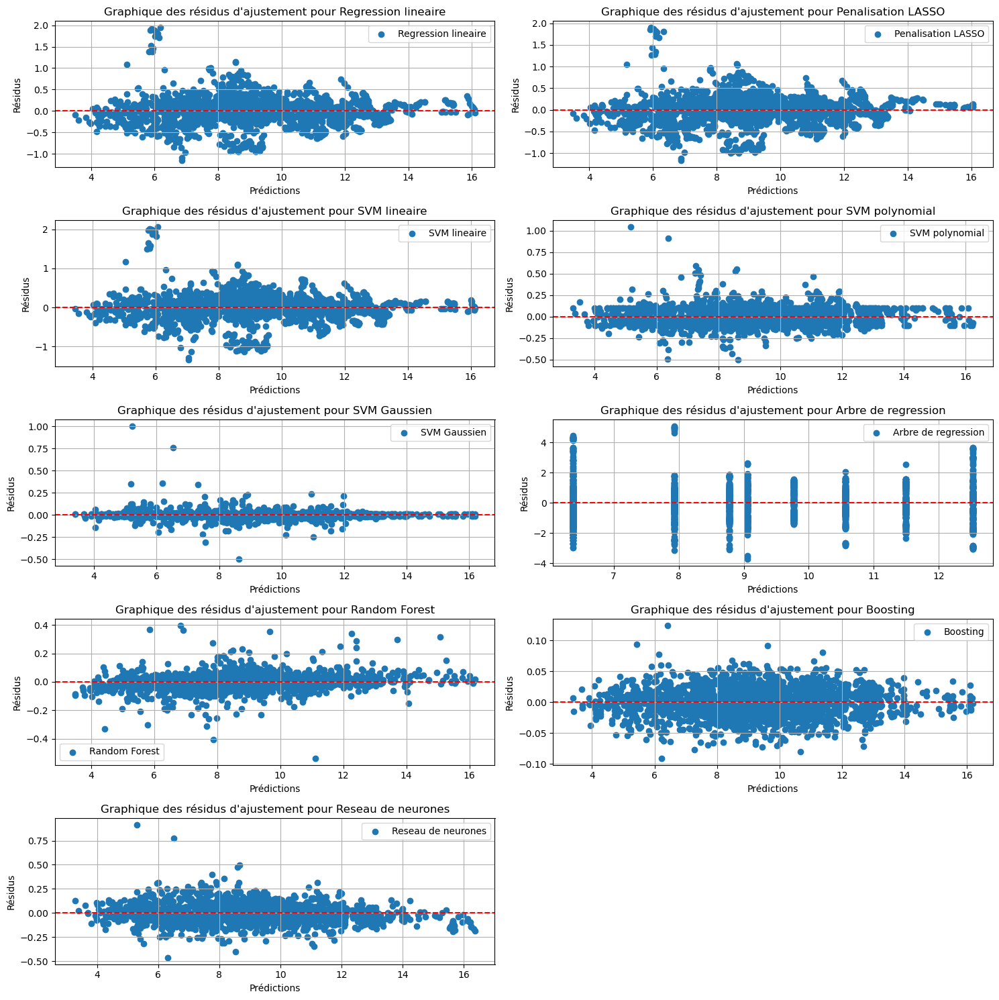

In [169]:

# Listes des noms des modèles et des instances de modèles déjà entraînés
list_name_model = ['Regression lineaire', 'Penalisation LASSO','SVM lineaire','SVM polynomial','SVM Gaussien','Arbre de regression','Random Forest','Boosting','Reseau de neurones']
list_model = [reg, regLassOpt, svmLinOpt, svmPolyOpt, svmGaussOpt, treeOpt, random_forest, best_gbr, nnetOpt]


# Affichage des scores d'ajustement des modèles sur l'ensemble d'entraînement
print('\nScore d\'ajustement des modèles :')
for i in range(len(list_model)) :
    model = list_model[i]
    print(list_name_model[i],':', model.score(X_train,log_y_train))

    
# Affichage des erreurs (MSE) des modèles sur l'ensemble d'entraînement
erreur_ajust = []    
print('\nMSE d\'ajustement des modèles :')
for i in range(len(list_model)) :
    model = list_model[i]
    pred = model.predict(X_train)
    erreur_ajust.append(mean_squared_error(log_y_train,pred))
    print(list_name_model[i],':',mean_squared_error(log_y_train,pred))
    
    
# Création des graphiques de résidus d'ajustement pour chaque modèle
plt.figure(figsize=(15,15))
for i in range(len(list_model)) :
    plt.subplot(5,2,i+1)
    model = list_model[i]
    pred = model.predict(X_train)
    residuals = log_y_train - pred
    plt.scatter(pred, residuals,label=list_name_model[i])
    plt.axhline(y=0, color='r', linestyle='--')
    plt.legend()
    plt.title('Graphique des résidus d\'ajustement pour '+list_name_model[i])
    plt.xlabel('Prédictions')
    plt.ylabel('Résidus')
    plt.grid(True)
plt.tight_layout()
plt.show()

En regardant les MSE et résidus d'ajustement, on se rend compte que le boosting semble être très performant. Il possède une MSE inférieure à 1e-3 et des résidus dépassant rarement 0.1. Cependant, il faut être conscient que le modèle peut-être sur-ajusté, il faut donc faire une analyse sur la généralisation du modèle sur l'échantillon de test.

MSE de généralisation des modèles :
Regression lineaire : 0.12545733959143707
Penalisation LASSO : 0.1254753400865244
SVM lineaire : 0.13491919446919623
SVM polynomial : 0.023610035693361897
SVM Gaussien : 0.0469254703251938
Arbre de regression : 1.7941451998985536
Random Forest : 0.02255939277609823
Boosting : 0.03005227967620338
Reseau de neurones : 0.03284865787579089


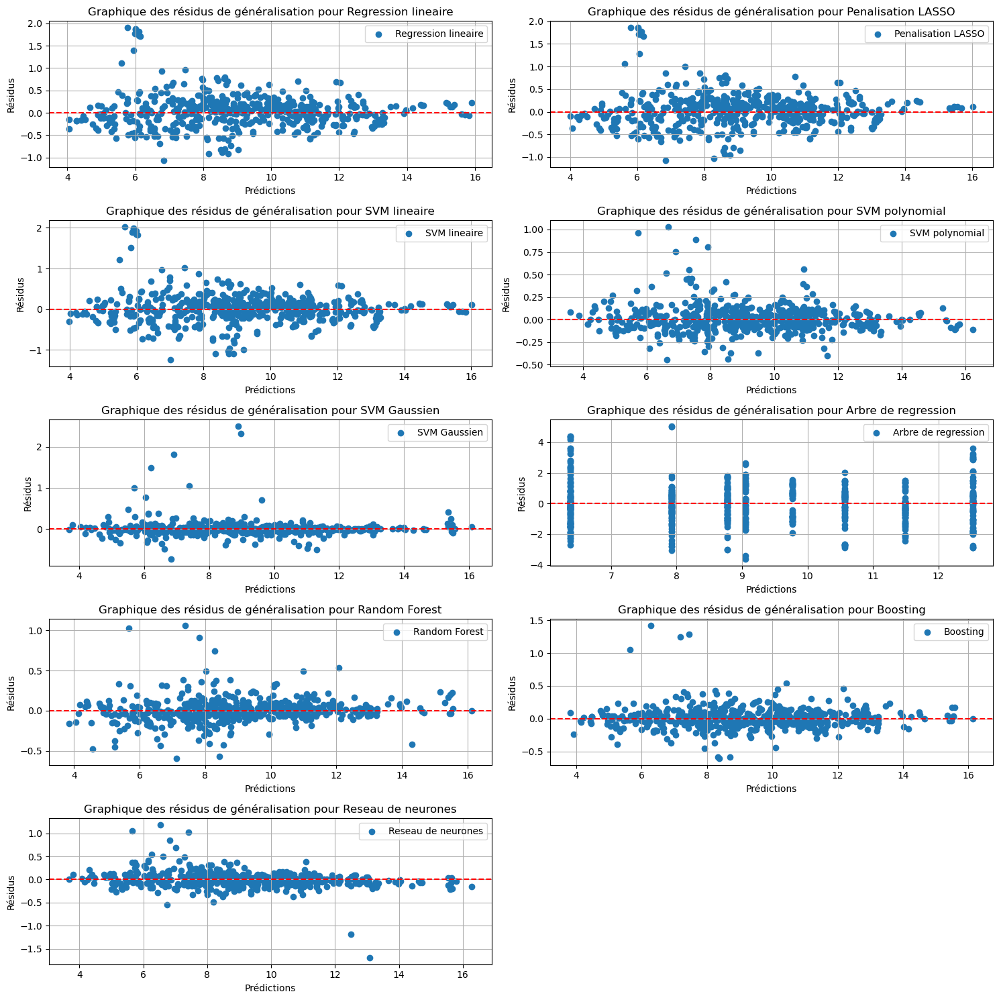

In [170]:
print('MSE de généralisation des modèles :')
for i in range(len(list_model)) :
    model = list_model[i]
    pred = model.predict(X_test)
    print(list_name_model[i],':',mean_squared_error(log_y_test,pred))

plt.figure(figsize=(15,15))
for i in range(len(list_model)) :
    plt.subplot(5,2,i+1)
    model = list_model[i]
    pred = model.predict(X_test)
    residuals = log_y_test - pred
    plt.scatter(pred, residuals,label=list_name_model[i])
    plt.axhline(y=0, color='r', linestyle='--')
    plt.legend()
    plt.title('Graphique des résidus de généralisation pour '+list_name_model[i])
    plt.xlabel('Prédictions')
    plt.ylabel('Résidus')
    plt.grid(True)
plt.tight_layout()

Ces différents graphes nous permettent de faire d'autres remarques:
- Pour le modèle linéaire, le modèle avec pénalisation LASSO et le SVM linéaire, les 3 graphiques de résidus ont la même forme et la même échelle, avec un pic de résidus allant jusqu'à 2 aux alentours de $Prédiction=8$. Aussi, la majorité des résidus sont compris entre -0.5 et 0.5. 
- Pour le SVM polynomial, l'échelle des résidus n'est plus la même. En effet, le maximum de résidus atteint 1 et se produit pour des valeurs à prédire entre 6 et 8. Les résidus sont globalement plus ressérés autour de 0.
- Pour le SVM Gaussien, les résidus semblent tout autant ressérés autour de 0 que pour le SVM polynomial, mais un grand pic de résidus atteignant 2.5 apparait pour deux prédictions aux alentours de 9.
- Pour les 3 méthodes basées sur SVM, on ne voit pas clairement le phénomène du tube apparaître. Cela est un bon signe, nos modèles sont, à priori, pas sur-ajustés.
- Pour l'arbre de régression, on reconnait son graphe de résidus caractéristique. En effet, les résidus sont représentés sur des lignes verticales car pour une entrée X, un arbre ne peut prédire qu'un nombre fini de sorti Y, correspondant à la moyenne des données d'entraînement sur la feuille finale. Dans notre cas, l'arbre de prédiction ne semble pas performant, avec des résidus allant jusqu'à 4.
- Pour Random Forest, les résidus ressemblent de près à ceux du modèle SVM polynomial, avec des résidus concentrés entre -0.25 et 0.25, et un pic montant jusqu'à 1 pour des valeurs à prédire entre 6 et 8.
- Les résultats du boosting semblent aller dans le sens d'un modèle sur-ajusté. En effet, son ajustement était particulièrement bon mais sa généralisation se rapproche des autres modèles. 
- Pour le réseau de neurones, on observe quelque chose qui n'apparait pas sur les autres graphiques de résidus. Un pic dans les négatifs atteignant -1.5 se produit pour des valeurs à prédire aux alentours de 13. 

Pour conclure, à la vue des erreurs de généralisation et des graphiques de résidus, les modèles qui semblent les plus performants semblent être le SVM polynomial, le Random Forest et le Réseau de Neurones. Attention cependant, tous les modèles semblent commettre des erreurs pour des émissions dont le log est entre 6 et 8. Essayons de voir maintenant les modèles les plus performants via la méthode de Monte Carlo.

Afin d'avoir un rendu un peu plus visuel de notre analyse, on décide d'afficher les boxplots des erreurs de généralisation, matérialisées par la MSE.

In [186]:
"""
from sklearn.utils import check_random_state
import time
tps0=time.perf_counter()
# Nombre d'itérations
B=30 # pour exécuter après le test, mettre plutôt B=30
# Initialisation à 0 des erreurs pour chaque méthode (colonne) et chaque itération (ligne)
arrayErreur=np.empty((B,len(list_model)))
for i in range(B):   # itérations sur B échantillons test
    if i%5 == 0 :
        print('iterations',i ,'à',i+5)
        
        
    # extraction apprentissage et test
    
    X_train_temp,X_test_temp,y_train_temp,y_test_temp=train_test_split(X, y, test_size=0.2)
    log_y_train_temp = np.log(y_train_temp)
    log_y_test_temp = np.log(y_test_temp)
    X_train_temp = X_train_temp.drop(['Entity','Year'],axis=1)
    X_test_temp = X_test_temp.drop(['Entity','Year'],axis=1)
    
    #Standardisation des données
    scaler = StandardScaler()  
    #print(X_train_temp)
    
    
    scaler.fit(X_train_temp)  
    X_train_temp = scaler.transform(X_train_temp)  
    
    
    # Meme transformation sur le test
    X_test_temp = scaler.transform(X_test_temp)
    
    
    # optimisation de chaque méthode et calcul de l'erreur sur le test
    for j, model in enumerate(list_model):
    
    
        #print(list_name_model[j])
        methFit=model.fit(X_train_temp, log_y_train_temp)
        arrayErreur[i,j]=1-methFit.score(X_test_temp,log_y_test_temp)
tps1=time.perf_counter()
print("Temps execution en secondes :",(tps1 - tps0))
dataframeErreur=pd.DataFrame(arrayErreur,columns=list_name_model)    
"""
#Création
array_erreur_post_run = [
    [0.01525455, 0.01525691, 0.01496939, 0.00396052, 0.00242567, 0.24018375, 0.00267373, 0.0043166, 0.00337992],
    [0.01543885, 0.01537419, 0.01556378, 0.00372834, 0.00342721, 0.25849628, 0.00286524, 0.00425278, 0.00269109],
    [0.01851345, 0.01882155, 0.01946983, 0.00373597, 0.00473962, 0.30993294, 0.00455958, 0.00542316, 0.00416407],
    [0.02073024, 0.02148536, 0.02265424, 0.00341912, 0.00681411, 0.25199768, 0.00391481, 0.00529013, 0.00424229],
    [0.01751066, 0.01769321, 0.01780536, 0.00281315, 0.00239803, 0.28550606, 0.00425971, 0.00424445, 0.00279948],
    [0.01791121, 0.01854169, 0.01849635, 0.0031668, 0.0069355, 0.30092233, 0.0031201, 0.00438278, 0.0038191],
    [0.01914336, 0.01955801, 0.0199767, 0.00383505, 0.00552111, 0.37500456, 0.00323716, 0.00498464, 0.00341281],
    [0.01662346, 0.01677048, 0.01663194, 0.0032424, 0.00311853, 0.32479226, 0.00305213, 0.00425634, 0.00306642],
    [0.01667258, 0.01744433, 0.01658821, 0.00319328, 0.00492686, 0.26729633, 0.00379198, 0.00500882, 0.00403469],
    [0.02019318, 0.02060065, 0.02073611, 0.00353162, 0.0095168, 0.30376548, 0.00355148, 0.00438666, 0.00262814],
    [0.01853013, 0.01897924, 0.01921733, 0.00382933, 0.00484023, 0.28533616, 0.00325011, 0.00455356, 0.00387923],
    [0.0200735, 0.02003847, 0.02080703, 0.00495725, 0.00484612, 0.30687752, 0.0035536, 0.00505305, 0.00472423],
    [0.01694733, 0.01698433, 0.01738781, 0.00275218, 0.00758959, 0.28158092, 0.00423344, 0.0042039, 0.00354361],
    [0.01921837, 0.01928555, 0.01971287, 0.00289997, 0.00580516, 0.32507549, 0.00472899, 0.00415012, 0.00403096],
    [0.02017605, 0.02062879, 0.02171859, 0.0035487, 0.00623722, 0.34774148, 0.00417467, 0.00450229, 0.004007],
    [0.01826373, 0.01869212, 0.0194962, 0.0038047, 0.00537344, 0.31988935, 0.00376881, 0.00579447, 0.00389712],
    [0.01439608, 0.01524882, 0.01466027, 0.00298077, 0.00205913, 0.2972504, 0.00271663, 0.00457727, 0.00319537],
    [0.01484623, 0.0154256, 0.01470931, 0.00329623, 0.00381074, 0.28218007, 0.00552382, 0.00405922, 0.00349338],
    [0.01833582, 0.01873694, 0.01828289, 0.00318011, 0.00222451, 0.36219087, 0.00319895, 0.00348953, 0.00258625],
    [0.01524279, 0.01622564, 0.01480469, 0.00279573, 0.00601357, 0.30270966, 0.00520144, 0.00482339, 0.0035449],
    [0.01358649, 0.01430048, 0.01324385, 0.00293059, 0.00275685, 0.31187687, 0.00286253, 0.00374215, 0.00312299],
    [0.01615082, 0.01647473, 0.01591086, 0.00365384, 0.00725697, 0.29958718, 0.00342853, 0.00609351, 0.00342309],
    [0.01594958, 0.01627768, 0.01696435, 0.00322761, 0.00334504, 0.27876109, 0.00364591, 0.00453852, 0.00347354],
    [0.01784346, 0.01815941, 0.01820294, 0.00316428, 0.00605975, 0.30785495, 0.00291959, 0.00496153, 0.00321228],
    [0.01334345, 0.01365521, 0.01351833, 0.00285044, 0.00178187, 0.28430867, 0.00232006, 0.00354935, 0.00268958],
    [0.01690623, 0.01754833, 0.01735826, 0.00302923, 0.00624915, 0.3027466, 0.003804, 0.00538841, 0.00354866],
    [0.01923918, 0.01965051, 0.02035647, 0.003426, 0.00311898, 0.28259798, 0.0042734, 0.00509638, 0.00366782],
    [0.01817185, 0.01898788, 0.01871645, 0.00261846, 0.00201444, 0.28355139, 0.00311518, 0.00400432, 0.00334184],
    [0.01672489, 0.01677472, 0.01647021, 0.0037961, 0.00658114, 0.31254764, 0.00322863, 0.00495217, 0.00382892],
    [0.01834015, 0.01874168, 0.01832539, 0.00309458, 0.00319058, 0.28770819, 0.00338526, 0.00406697, 0.00335358]
]
dataframeErreur=pd.DataFrame(array_erreur_post_run,columns=list_name_model)    


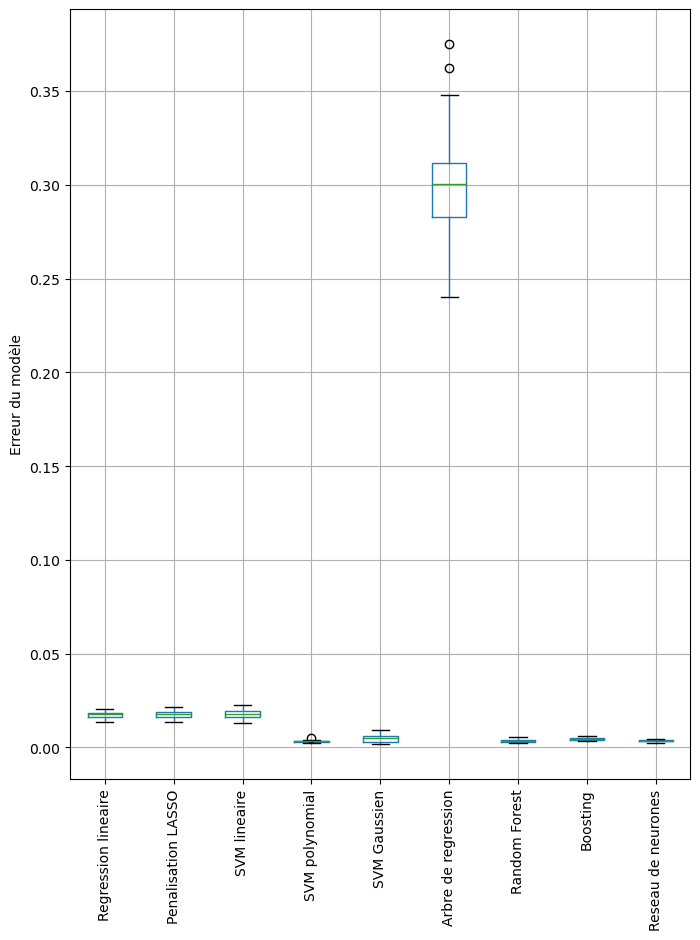

In [190]:
# Affichage des boxplots pour les erreurs de chaque modèle
dataframeErreur[list_name_model].boxplot(return_type='dict')
plt.xticks(rotation = 'vertical')
plt.ylabel('Erreur du modèle')
plt.show()

L'affichage des boxplots nous montre que l'arbre de regression est beaucoup moins efficace que les autres modèles.

En effet, on voit que la médiane de l'erreur de généralisation de son boxplot est beaucoup plus importante que les autres, de même pour sa variance. Alors que notre objectif est d'avoir des boxplots ressérés autour de la médiane et la médiane proche de 0.

On décide de réafficher les boxplots de tous les modèles sauf celui de l'arbre de regression, pour avoir un affichage plus optimisé.

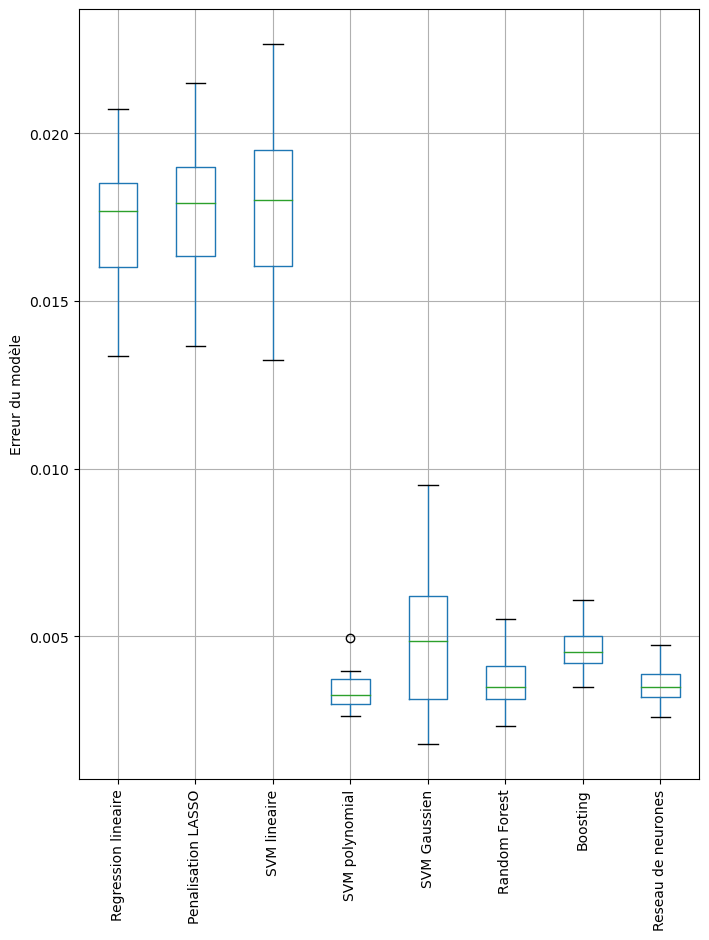

In [191]:
# Affichage des boxplots pour les erreurs de chaque modèle
dataframeErreur[['Regression lineaire', 'Penalisation LASSO','SVM lineaire','SVM polynomial','SVM Gaussien','Random Forest', 'Boosting', 'Reseau de neurones']].boxplot(return_type='dict')
plt.xticks(rotation = 'vertical')
plt.ylabel('Erreur du modèle')
plt.show()

Ainsi, à partir de notre calcul d'erreur par Monte Carlo et l'affichage des boxplots, on remarque que les 3 meilleurs modèles de prédictions sont :
- Réseau de neurones
- SVM avec noyau polynomial
- Random Forest

**4. Interprétation et retour sur l’analyse des données: vos résultats sont-ils cohérents avec l’analyse exploratoire des données, par exemple en ce qui concerne l’importance des variables ?**

Afin de répondre à la question, établissons une synthèse des résultats obtenus pour chacun des modèles concernant l'importance des variables lorsque nous possèdons des indicateurs fiables. Rappelons que nous avons décidé de construire nos modèles afin de prédire la variable 'log_Value_co2_emissions_kt_by_country'. De plus, nous avons supprimé la variable ‘Electricity from fossils fuels’ car elle était trop corrélée avec notre variable à prédire. C’est donc pour cela que l’on ne la voit pas apparaître dans les analyses suivantes.

Pour les modèles linéaires (avec et sans pénalisation), nous avons observé les coefficients positifs liés aux variables explicatifs pour chaque modèle. Les coefficients positifs les plus grands représentent les variables explicatives qui contribuent le plus au modèle et donc à la valeur de la variable à prédire. 

- **Modèle linéaire simple :**

o	En **Python**, nous trouvons que les variables les plus importantes sont : 

  	'log_Land_Area'
  
   'log_Density'
  
  	'log_Primary energy consumption per capita (kWh/person)'


o	En **R** : 

  	'log_Land_Area'
  
  	'log_Primary energy consumption per capita (kWh/person)'
  
   'log_Density'


  
-	**LASSO :**

o	En **Python** et en **R** nous obtenus que les variables les plus importantes sont :

	'log_Land_Area'

	'log_Density'

	'log_Primary energy consumption per capita (kWh/person)'

- **Arbre de régression :**

L'arbre de régression est un modèle très interprétable en terme d'importance des variables. En effet, il nous suffit de regarder les variables les plus proches de l’origine de l’arbre. Ainsi, d’après les affichages de R et Python, on peut déduire que les variables les plus importantes sont, ‘Electricity from Renewables’, ‘Electricity from Nuclear’ et ‘Latitude’. 

- **Random forest :**

Le modèle Random forest est comme nous le savons très compliqué à interpréter. Ainsi, pour avoir des informations sur l'importance des variables, on utilise l'indicateur Mean Decrease Impurity (MDI). En voici les résultats : 

o En **Python**, nous trouvons que les variables les plus importantes sont : 

  ‘Electricity from Renewables’
 
  ‘Electricity from Nuclear’
 
  ‘Latitude’
 
  ‘Electricity from Nuclear’
 
 o	En **R**, nous avons :
 
  ‘Electricity from Renewables’
 
  ‘Electricity from Nuclear’
 
  ‘Land_Area’ & 'log_Land_Area'
 
  ‘Latitude’

 
 
On obtient des résultats un peu différents entre R et Python, mais on peut quand même conclure que les trois variables importantes de notre modèle Random Forest sont : ‘Electricity from Renewables’, ‘Latitude’, ‘Electricity from Nuclear’. 

Les autres modèles ne possèdent pas d'indicateurs nous permettons d'obtenir des résultats explicites, nous avons donc décidé de ne pas les citer ici. 

En conclusion, d’après la plupart des modèles, hors modèles linéaires, on trouve que les variables *‘Electricity from Renewables’, ‘Electricity from Nuclear’ et ‘Latitude’* sont les variables les plus importantes dans la prédiction des valeurs des émissions de C02. 

On peut trouver cela logique que la *‘Latitude’* soit une variable importante, en effet on a vu que les valeurs des émissions fluctuent en fonction des pays, ce qui signifie que la localisation d’un pays influent sur les émissions de CO2 et chaque pays comporte une paire (latitude, longitude) qui détermine sa position géographique. 

Si nous comparons ces résultats à l’analyse exploratoire, on voit globalement que les modèles linéaires avec et sans pénalisation ont tendance à privilégier la variable la plus corrélée avec notre variable à prédire. En effet, en regardant la matrice de corrélation, on retrouve que la variable la plus corrélée avec *'log_Value_co2_emissions_kt_by_country'* est *'log_Land_Area'*. Cette variable représente celle que les modèles linéaire et LASSO privilégient dans leur modèle. 

De plus, par rapport à l’ACP sur le *'log_Value_co2_emissions_kt_by_country'*, on ne possède pas d'interprétations claires de l’ACP, donc on ne pas faire de comparaison pertinente. 

Enfin, on avait émis un potentiel lien entre la variable à prédire et la variable *‘Year’*. Cependant, cette variable étant qualitative nous ne l’avons pas pris en compte dans l’établissement de nos modèles.


## Complétion des données manquantes :

**5. Dans un second temps, vous pourrez utiliser un algorithme de complétion des valeurs manquantes et
reprendre la modélisation (pour les algorithmes qui se sont montrés les plus performants) avec le jeu de
données complété.**


Python propose beaucop moins d'options que R sur les données manquantes et gère mal le mélange de données qualitatives et quantitatives. Cependant, cela n'est pas grave car dans nos données les seules variables qualitative sont 'Entity' et 'Year' et elles ne comportent pas de NA.

Par soucis de temps et de précision, nous avons décidé de ne faire la complétion de données manquantes que sur le notebook R.

Ainsi, nous avons testé les différentes méthodes d'imputations de données manquantes (imputation simple, imputation par kNN et par Random Forest). Nous avons ensuite calculé les erreurs générées par chaque méthode. Puis, nous avons imputé nos données par la méthode possédant la plus petite erreur, cela nous a permis de fabriquer notre nouveau dataset. 

Rappelons tout de même que nous avons supprimé les individus possèdant des valeurs manquantes dans la variable à prédire et nous n'avons pas réintroduit les trois variables 'Renewable-electricity-generating-capacity-per-capita','Financial flows to developing countries (US $)' et 'Renewables (% equivalent primary energy)' supprimées précédemment car elles possèdaient trop de valeurs manquantes. 

Après la création de notre nouveau dataset, nous avons appliqué les modèles les plus performants sur le jeu de données complété et avons calculé les erreurs de généralisation. 

### ANALYSE => JUJU??


In [174]:
data = pd.read_csv('global-data-on-sustainable-energy (1).csv')

data["Density(P/Km2)"] = data["Density(P/Km2)"].apply(lambda x : float(x.replace(',','')) if type(x)==str else x)

data.head()
 
nb_data_missing = data.isna().sum()
taux_data_missing = nb_data_missing/len(data)

On en conclut que l'on peut partir sur une méthode de complétion sur les variables quantitatives seulement.

Access to electricity (% of population)                             0.002740
Access to clean fuels for cooking                                   0.046314
Renewable energy share in the total final energy consumption (%)    0.053165
Electricity from fossil fuels (TWh)                                 0.005755
Electricity from nuclear (TWh)                                      0.034530
Electricity from renewables (TWh)                                   0.005755
Low-carbon electricity (% electricity)                              0.011510
Primary energy consumption per capita (kWh/person)                  0.000000
Energy intensity level of primary energy (MJ/$2017 PPP GDP)         0.056728
Value_co2_emissions_kt_by_country                                   0.117292
gdp_growth                                                          0.086873
gdp_per_capita                                                      0.077281
Density(P/Km2)                                                      0.000274

<Axes: >

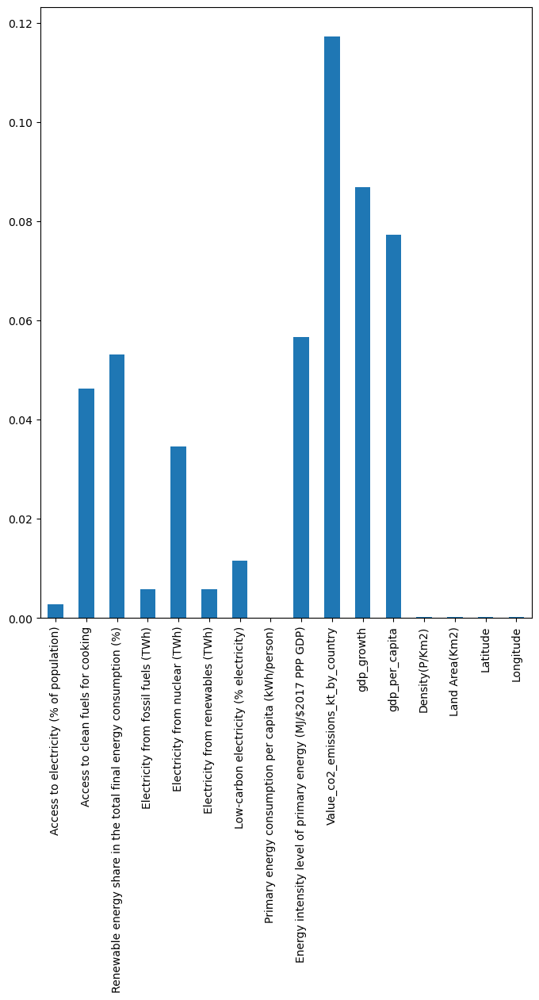

In [175]:
colonnes_quanti = [col for col in data.columns if col not in ['Entity',
                                                              'Year',
                                                              'Renewable-electricity-generating-capacity-per-capita',
                                                              'Financial flows to developing countries (US $)',
                                                              'Renewables (% equivalent primary energy)']]
data_quanti = data[colonnes_quanti]

nrows = len(data_quanti)
missing_rates = 1-data_quanti.count(axis=0)/nrows
print(missing_rates)

data_non_na = data_quanti.dropna()

missing_rates.plot.bar()

In [176]:
from sklearn.impute import  KNNImputer

knn_imputer = KNNImputer(n_neighbors=5)
data_kNN = knn_imputer.fit_transform(data_quanti)

data_kNNImp=pd.DataFrame(data_kNN, columns=data_quanti.columns)

In [177]:
print(len(data_kNNImp))

3649


# Complétion des données manquantes 

On a réalisé l'imputation des données manquantes sur le notebook R.

### 1. Complétion par les k plus proches voisins

L'algorithme de complétion KNN (K-Nearest Neighbors) impute les valeurs manquantes en remplaçant chaque valeur manquante par la moyenne ou la médiane des valeurs des k voisins les plus proches dans l'espace des caractéristiques.

L'argument 'k=5' spécifie que pour chaque valeur manquante, l'algorithme kNN utilisera les 5 voisins les plus proches pour estimer la valeur manquante.

### 2. Complétion par MissForest

MissForest est une méthode d'imputation des données manquantes qui utilise des forêts aléatoires. Elle remplace les valeurs manquantes en utilisant des prédictions basées sur les données observées dans les autres variables. Ce processus est itératif et se poursuit jusqu'à convergence. 

## Comparaison des deux imputations de données

Dans cette partie, on va comparer l'erreur de généralisation des méthodes d'imputation de données suivantes : kNN, miss forest, sur les modèles suivants : random forest, SVM (noyau polynomial), et un réseau de neurones. On fait cela dans le but de choisir l'imputation de données que l'on va comparer avec nos analyses précédentes.

### Random Forest  

Pour random forest, missForest semble plus performant que kNN en observant le graphe des résidus. Cependant, la MSE nous dit l'inverse, ce qui est sûrement dû au fait que missForest semble très mal classifier certains points, la où kNN semble avoir moins de variance.

### SVM polynomial

Cette fois-ci, c'est miss forest qui est légèrement meilleur que kNN.

### Réseau de neurones

Pour le réseau de neurones, kNN semble être plus performant.

En conclusion, on va choisir la méthode d'imputation de données kNN, afin de compléter les valeurs manquantes dans le dataframe. On choisit cette dernière car elle est légèrement performante sur deux des trois méthodes testées, tout en prenant beaucoup moins de temps à s'éxecuter.

## Comparaison modèles avec et sans imputations

On trouve ainsi que le jeu de données avec imputation de données est globalement plus performant que le jeu de données non imputé. Ainsi, il semblerait que l'imputation de données kNN soit très efficace sur notre jeu de données, et le meilleur modèle que l'on trouve serait random forest, sur les données imputées avec kNN.